In [ ]:
# %pip install pandas
!pip install rusenttokenize
# %pip install tokenizers

In [ ]:
import pandas as pd
from rusenttokenize import ru_sent_tokenize

In [ ]:
data = pd.read_csv('https://github.com/mannefedov/compling_nlp_hse_course/raw/refs/heads/master/data/lenta_40k.csv.zip')

In [ ]:
data.head()

,text,topic
0,Россия должна сотрудничать с Всемирным антидоп...,Спорт
1,Уголовный суд Кувейта 28 июня освободил под за...,Мир
2,Французский журнал Charlie Hebdo опубликовал н...,Интернет и СМИ
3,В Петербурге в доме № 53 по улице Лени Голиков...,Россия
4,"В московском аэропорту ""Домодедово"" задержан г...",Россия


Нам понадобятся только тексты. Также трансформеры очень чувствительны к длине текста, поэтому для простоты разделим все тексты на предложения и будем считать каждое предложение одним текстом.

In [ ]:
sentences = []
for text in data.text.values:
    sentences.extend(ru_sent_tokenize(text))

In [ ]:
sentences

['Россия должна сотрудничать с Всемирным антидопинговым агентством (WADA), чтобы ее легкоатлеты смогли выступить на Олимпийских играх 2016 года в Рио-де-Жанейро.',
 'Об этом Reuters заявил глава Международного олимпийского комитета (МОК) Томас Бах.',
 '«Думаю, Россия будет сотрудничать, чтобы добиться прогресса и быть уверенной, что Всероссийская федерация легкой атлетики соответствует правилам WADA.',
 'Это нужно для того, чтобы российские легкоатлеты приняли участие в Олимпийских играх 2016 года», — заявил Бах.',
 'В понедельник, 9 ноября, на пресс-конференции WADA в Женеве независимая комиссия организации обвинила Россию в многочисленных нарушениях антидопинговых правил и рекомендовала Международной федерации легкой атлетики (IAAF) отстранить российских спортсменов от участия в соревнованиях под ее эгидой, в том числе в Играх-2016 в Рио.',
 'Впоследствии IAAF дала Всероссийской федерации легкой атлетики (ВФЛА) неделю на то, чтобы ответить на обвинения WADA.',
 'Пресс-секретарь прези

In [ ]:
# почти 500 тыс предложений
len(sentences)

489727

In [ ]:
# cохраним в отдельный файл чтобы больше не тратить время на токенизацию,
# также файл понадобится дальше для обучения токенизатора
f = open('corpus.txt', 'w')
for sent in sentences:
    f.write(sent + '\n')
f.close()

In [ ]:
sentences = open('corpus.txt').read().splitlines()

In [ ]:
from tokenizers import Tokenizer
from tokenizers.models import BPE
from tokenizers.pre_tokenizers import Whitespace
from tokenizers.trainers import BpeTrainer
from tokenizers import decoders

In [ ]:
tokenizer = Tokenizer(BPE())
tokenizer.pre_tokenizer = Whitespace()
trainer = BpeTrainer(special_tokens=["[PAD]", "[BOS]", "[EOS]"], end_of_word_suffix='</w>')

In [ ]:
# токенайзер обучается на файле а не на питоновских списках
tokenizer.train(files=["corpus.txt"], trainer=trainer)

In [ ]:
# сохраним токенизатор
tokenizer.save('tokenizer')

In [ ]:
# при перезапуске можно просто перезагрузить готовый токенизатор
# также он понадобится если мы решим сохранить модель
tokenizer = Tokenizer.from_file("tokenizer")

In [ ]:
tokenizer.decoder = decoders.BPEDecoder()

In [ ]:
vocab_size = tokenizer.get_vocab_size()

In [ ]:
vocab_size

30000

Посмотрим что получается в результате токенизации

In [ ]:
tokenizer.encode('Какой-то напечатанный текст').ids

[867, 995, 547, 720, 686, 3777, 1469, 808, 9357]

In [ ]:
tokens = tokenizer.encode('Какой-то напечатанный текст').tokens
tokenizer.decoder.decode(tokens)

'Какой - то напечатанный текст'

Напишем еще функцию которая будет подставлять BOS и EOS токены

In [ ]:
def encode(text, tokenizer):
    return [tokenizer.token_to_id('[BOS]')] + tokenizer.encode(text).ids + [tokenizer.token_to_id('[EOS]')]

Индекс паддинг токена пригодится позже для маскинга

In [ ]:
PAD_IDX = tokenizer.token_to_id('[PAD]')

In [ ]:
PAD_IDX

0

Теперь токенизируем все предложения и создадим датасет, который будет передавать в модель

In [ ]:
import torch

In [ ]:
class Dataset(torch.utils.data.Dataset):

    def __init__(self, sentences, tokenizer, max_len=32):
        # каждое предложение преобразуется в последовательность индексов
        # а списки преобразуются в тензоры
        self.encoded_texts = [torch.LongTensor(encode(sent, tokenizer)[-max_len:]) for sent in sentences]
        # чтобы составить один общий обучающий тензор нужно сравнять длины последовательностей отдельных текстов
        # в торче не такая удобная функция паддинга, поэтому транкация (отрезание лишнего) происходит уже выше
        self.X = torch.nn.utils.rnn.pad_sequence(self.encoded_texts, padding_value=PAD_IDX, batch_first=True)
        self.length = len(self.encoded_texts)

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        x = self.X[index][:-1]
        y = self.X[index][1:]

        mask = x!=PAD_IDX

        return x, y, mask

In [ ]:
n = int(0.9*len(sentences)) # first 90% will be train, rest val
sentences_train = sentences[:n]
sentences_val = sentences[n:]

In [ ]:
MAX_LEN = 64

In [ ]:
training_set = Dataset(sentences_train, tokenizer, MAX_LEN)
val_set = Dataset(sentences_val, tokenizer, MAX_LEN)

In [ ]:
training_set[0]

(tensor([    1,  1911,  2939, 14713,   418,  5442,   833, 13328, 26169, 15291,
           511, 16131,  1126,  1389,  1102, 20933,  2983,  5198, 12060,   691,
          9143, 10699,  2376,   829,   385, 11044,   547,   893,   547, 13170,
           421,     2,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0]),
 tensor([ 1911,  2939, 14713,   418,  5442,   833, 13328, 26169, 15291,   511,
         16131,  1126,  1389,  1102, 20933,  2983,  5198, 12060,   691,  9143,
         10699,  2376,   829,   385, 11044,   547,   893,   547, 13170,   421,
             2,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     

In [ ]:
training_generator = torch.utils.data.DataLoader(training_set, batch_size=200, shuffle=True, )
val_generator = torch.utils.data.DataLoader(val_set, batch_size=200, shuffle=False)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
# hyperparameters
block_size = MAX_LEN # what is the maximum context length for predictions?
learning_rate = 1e-3
device = 'cuda' if torch.cuda.is_available() else 'cpu'
n_embd = 64 # размерность эмбеддингов и векторов внутри трансформера
#ffn_hid_dim = n_embd * 4
n_head = 4
n_layer = 4
dropout = 0.0

In [ ]:
class Head(nn.Module):
    """ one head of self-attention """

    def __init__(self, head_size):
        super().__init__()
        self.key = nn.Linear(n_embd, head_size, bias=False)
        self.query = nn.Linear(n_embd, head_size, bias=False)
        self.value = nn.Linear(n_embd, head_size, bias=False)
        self.register_buffer('tril', torch.tril(torch.ones(block_size, block_size)))
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None):
        B, T, C = x.shape
        k = self.key(x)   # (B,T,C)
        q = self.query(x) # (B,T,C)
        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2,-1) * C**-0.5 # (B, T, T)
        wei = wei.masked_fill(self.tril[:T, :T] == 0, float('-inf')) # (B, T, T)
        if mask is not None:
            wei = wei.masked_fill(~mask.unsqueeze(1), float('-inf'))
        wei = F.softmax(wei, dim=-1) # (B, T, T)
        wei = self.dropout(wei)
        # perform the weighted aggregation of the values
        v = self.value(x) # (B,T,C)
        out = wei @ v # (B, T, T) @ (B, T, C) -> (B, T, C)
        return out, wei


class MultiHeadAttention(nn.Module):
    """ multiple heads of self-attention in parallel """
    def __init__(self, num_heads, head_size):
        super().__init__()
        self.heads = nn.ModuleList([Head(head_size) for _ in range(num_heads)])
        self.proj = nn.Linear(n_embd, n_embd)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None):
        outs = []
        attentions = []
        for h in self.heads:
            out, att = h(x, mask)
            outs.append(out)
            attentions.append(att)
        out = torch.cat(outs, dim=-1)
        out = self.dropout(self.proj(out))
        return out, attentions


class FeedFoward(nn.Module):
    """ a simple linear layer followed by a non-linearity """

    def __init__(self, n_embd):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(n_embd, 4 * n_embd),
            nn.ReLU(),
            nn.Linear(4 * n_embd, n_embd),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x)


class Block(nn.Module):
    """ Transformer block: communication followed by computation """

    def __init__(self, n_embd, n_head):
        super().__init__()
        head_size = n_embd // n_head
        self.sa = MultiHeadAttention(n_head, head_size)
        self.ffwd = FeedFoward(n_embd)
        self.ln1 = nn.LayerNorm(n_embd)
        self.ln2 = nn.LayerNorm(n_embd)

    def forward(self, inp):
        x, mask = inp
        x, attentions = self.sa(self.ln1(x), mask)
        x = x + self.sa(self.ln1(x), mask)[0]
        x = x + self.ffwd(self.ln2(x))
        return (x, mask), attentions


In [ ]:
class GPTLanguageModel(nn.Module):

    def __init__(self):
        super().__init__()
        # each token directly reads off the logits for the next token from a lookup table
        self.token_embedding_table = nn.Embedding(vocab_size, n_embd)
        self.position_embedding_table = nn.Embedding(block_size, n_embd)
        self.blocks = nn.Sequential(*[Block(n_embd, n_head=n_head) for _ in range(n_layer)])
        self.ln_f = nn.LayerNorm(n_embd) # final layer norm
        self.lm_head = nn.Linear(n_embd, vocab_size)
        self.last_attentions = None

    def forward(self, idx, targets=None, mask=None):
        B, T = idx.shape

        all_attentions = []

        tok_emb = self.token_embedding_table(idx)
        pos_emb = self.position_embedding_table(torch.arange(T, device=device))
        x = tok_emb + pos_emb

        for block in self.blocks:
            (x, mask), attentions = block((x, mask))
            all_attentions.append(attentions)

        x = self.ln_f(x)
        logits = self.lm_head(x)

        self.last_attentions = all_attentions

        if targets is None:
            loss = None
        else:
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)
            loss = F.cross_entropy(logits, targets, ignore_index=PAD_IDX)

        return logits, loss

    def generate(self, idx, max_new_tokens, stop_token):
        # idx is (B, T) array of indices in the current context
        for _ in range(max_new_tokens):
            # crop idx to the last block_size tokens
            idx_cond = idx[:, -block_size:]
            # get the predictions
            logits, loss = self(idx_cond)
            # focus only on the last time step
            logits = logits[:, -1, :] # becomes (B, C)
            # apply softmax to get probabilities
            probs = F.softmax(logits, dim=-1) # (B, C)
            # sample from the distribution
            idx_next = torch.multinomial(probs, num_samples=1)# (B, 1)
            if idx_next == stop_token:
                break
            # append sampled index to the running sequence
            idx = torch.cat((idx, idx_next), dim=1) # (B, T+1)
        return idx

In [ ]:
attention_by_epoch = []

def collect_attention_after_epoch(model, dataloader, epoch):
    """Вызывает модель на одном примере и сохраняет attention веса"""
    model.eval()
    with torch.no_grad():
        for xs, ys, mask in dataloader:
            xs, ys, mask = xs.to(device), ys.to(device), mask.to(device)
            _, _ = model(xs, ys, mask)
            break

    if model.last_attentions is not None:
        attention_data = {
            'epoch': epoch,
            'attentions': [
                [att[0].detach().cpu().numpy() for att in layer_atts]  # [n_head, B, T, T]
                for layer_atts in model.last_attentions  # [n_layer]
            ],
            'input_tokens': xs[0].detach().cpu().numpy(),
            'mask': mask[0].detach().cpu().numpy()
        }
        attention_by_epoch.append(attention_data)
        print(f"Saved attention for epoch {epoch}")
        return attention_data
    return None

In [ ]:
model = GPTLanguageModel()
m = model.to(device)
# print the number of parameters in the model
print(sum(p.numel() for p in m.parameters())/1e6, 'M parameters')

4.073392 M parameters


In [ ]:
# create a PyTorch optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

Код обучения просто передает в модель батчи из датасета

In [ ]:
def train(model, iterator, optimizer, print_every=10):
    epoch_loss = []
    model.train()

    for i, (xs, ys, mask) in enumerate(iterator):
        optimizer.zero_grad()
        logits, loss = model(xs.to(device), ys.to(device), mask.to(device))

        loss.backward()
        optimizer.step()

        epoch_loss.append(loss.item())

        if not (i+1) % print_every:
            print(f'Loss: {torch.Tensor(epoch_loss).mean(-1)}')

    return torch.Tensor(epoch_loss).mean(-1)

def evaluate(model, iterator):
    epoch_loss = []
    model.eval()
    with torch.no_grad():
        for xs, ys, mask in iterator:
            logits, loss = model(xs.to(device), ys.to(device), mask.to(device))
            epoch_loss.append(loss.item())


    return torch.Tensor(epoch_loss).mean(-1)

При обучении после каждой эпохи генерируется текст чтобы видеть прогресс

In [ ]:
train_losses = []
eval_losses = []
for i in range(20):
    print(i)
    train_losses.append(train(model, training_generator, optimizer, 100))
    eval_loss = evaluate(model, val_generator)
    print('Eval - ', eval_loss.item())
    eval_losses.append(eval_loss)
    attention_data = collect_attention_after_epoch(model, val_generator, epoch=i)
    for _ in range(3):
        pred = model.generate(torch.LongTensor([[tokenizer.token_to_id('[BOS]')]]).to(device), 200, tokenizer.token_to_id('[EOS]'))
        print(tokenizer.decoder.decode([tokenizer.id_to_token(i) for i in pred.detach().cpu().numpy()[0]][1:-1]))

0
Loss: 8.659409523010254
Loss: 8.348723411560059
Loss: 8.217552185058594
Loss: 8.141855239868164
Loss: 8.091045379638672
Loss: 8.048644065856934
Loss: 7.994470596313477
Loss: 7.9464898109436035
Loss: 7.902115345001221
Loss: 7.8599982261657715
Loss: 7.818408012390137
Loss: 7.776249885559082
Loss: 7.732579708099365
Loss: 7.6871819496154785
Loss: 7.641819477081299
Loss: 7.596585273742676
Loss: 7.55164098739624
Loss: 7.508906841278076
Loss: 7.46818208694458
Loss: 7.4283528327941895
Loss: 7.3901495933532715
Loss: 7.354770660400391
Eval -  6.654139995574951
Saved attention for epoch 0
Собвается бронк 42 8 и 6баррель Демьянтор начале введении в интернет году , 73 страны после ранцию на 42 года
Об этом сообщает « France - au Австралимыми НефтеслуМутко ЦБ Госдумы о Россию
Аршавин стюардеева мать признаны заявил по интерестельная аварийную нем академивича алтаследовакс и ЮАР Тараму Валкова — О вопрос жизни грепострадала , баллистической сайт в частности День потрачено причасоману человеком " Че

In [ ]:
attention_by_epoch[0]

{'epoch': 0,
 'attentions': [[array([[1.        , 0.        , 0.        , ..., 0.        , 0.        ,
           0.        ],
          [0.9840806 , 0.01591943, 0.        , ..., 0.        , 0.        ,
           0.        ],
          [0.20947854, 0.41400498, 0.37651646, ..., 0.        , 0.        ,
           0.        ],
          ...,
          [0.02214859, 0.03721438, 0.02805204, ..., 0.        , 0.        ,
           0.        ],
          [0.0202548 , 0.02356139, 0.02813205, ..., 0.        , 0.        ,
           0.        ],
          [0.03102277, 0.03947525, 0.0368189 , ..., 0.        , 0.        ,
           0.        ]], dtype=float32),
   array([[1.        , 0.        , 0.        , ..., 0.        , 0.        ,
           0.        ],
          [0.1085529 , 0.89144707, 0.        , ..., 0.        , 0.        ,
           0.        ],
          [0.06677934, 0.3119456 , 0.6212751 , ..., 0.        , 0.        ,
           0.        ],
          ...,
          [0.01294616, 0.0

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_attention_heatmap(attention_matrix, tokens, layer_idx, head_idx, epoch, save_path=None):
    valid_mask = tokens != PAD_IDX
    valid_indices = np.where(valid_mask)[0]
    valid_tokens = [tokenizer.id_to_token(i) for i in tokens[valid_indices]]

    attention_matrix = attention_matrix[0]
    attention_matrix = attention_matrix[valid_indices][:, valid_indices]

    plt.figure(figsize=(12, 10))
    sns.heatmap(attention_matrix,
                xticklabels=valid_tokens,
                yticklabels=valid_tokens,
                cmap='viridis',
                annot=False,
                cbar_kws={'label': 'Attention Weight'})
    plt.title(f'Epoch {epoch} | Layer {layer_idx} | Head {head_idx}\nAttention Weights',
              fontsize=14, fontweight='bold')
    plt.xlabel('Key (attended tokens)', fontsize=12)
    plt.ylabel('Query (attending token)', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


In [ ]:
def plot_attention_evolution(attention_by_epoch, layer_idx, head_idx, token_positions, save_path=None):
    """Построение эволюции attention для конкретных токенов по эпохам"""

    n_epochs = len(attention_by_epoch)
    cols = 4
    rows = (n_epochs + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))

    if n_epochs == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = axes.reshape(1, -1)

    for idx, attention_data in enumerate(attention_by_epoch):
        epoch = attention_data['epoch']
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]

        attention_matrix = attention_data['attentions'][layer_idx][head_idx]

        valid_mask = attention_data['input_tokens'] != PAD_IDX
        valid_indices = np.where(valid_mask)[0]
        attention_matrix = attention_matrix[valid_indices][:, valid_indices]

        if len(token_positions) > 0:
            attention_slice = attention_matrix[token_positions, :]
        else:
            attention_slice = attention_matrix

        sns.heatmap(attention_slice,
                    cmap='viridis',
                    ax=ax,
                    cbar_kws={'label': 'Attention Weight'},
                    annot=False)
        ax.set_title(f'Epoch {epoch}', fontsize=12, fontweight='bold')
        ax.set_xlabel('Attended tokens', fontsize=10)
        ax.set_ylabel('Query tokens', fontsize=10)

    for idx in range(n_epochs, rows * cols):
        row = idx // cols
        col = idx % cols
        axes[row, col].axis('off')

    plt.suptitle(f'Attention Evolution | Layer {layer_idx} | Head {head_idx}',
                 fontsize=16, fontweight='bold')
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
def plot_all_heads_for_layer(attention_data, tokens, layer_idx, epoch, save_path=None):
    """Построение всех head для одного слоя"""

    valid_mask = tokens != PAD_IDX
    valid_indices = np.where(valid_mask)[0]
    valid_tokens = [tokenizer.id_to_token(i) for i in tokens[valid_indices]]

    layer_attentions = attention_data['attentions'][layer_idx]
    n_heads = len(layer_attentions)

    fig, axes = plt.subplots(1, n_heads, figsize=(5 * n_heads, 5))

    if n_heads == 1:
        axes = [axes]

    for head_idx in range(n_heads):
        att_matrix = layer_attentions[head_idx]  # (seq_len, seq_len)
        att_matrix = att_matrix[valid_indices][:, valid_indices]

        sns.heatmap(att_matrix,
                    xticklabels=valid_tokens,
                    yticklabels=valid_tokens,
                    cmap='viridis',
                    ax=axes[head_idx],
                    cbar_kws={'label': 'Weight'},
                    annot=False)
        axes[head_idx].set_title(f'Head {head_idx}', fontsize=12, fontweight='bold')
        axes[head_idx].tick_params(axis='x', rotation=45, labelsize=8)
        axes[head_idx].tick_params(axis='y', rotation=0, labelsize=8)

    plt.suptitle(f'Epoch {epoch} | Layer {layer_idx} | All Heads', fontsize=16, fontweight='bold')
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

Визуализация attention для каждой эпохи

 Эпоха 0


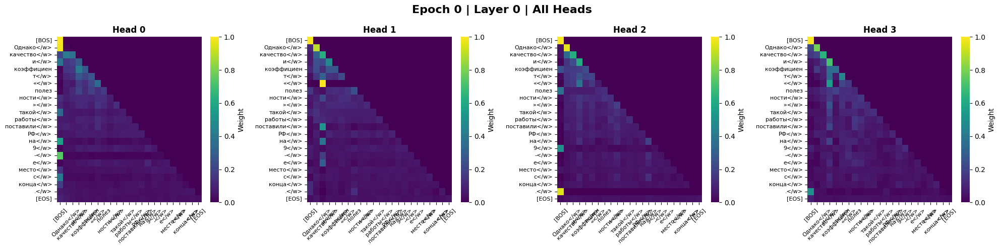

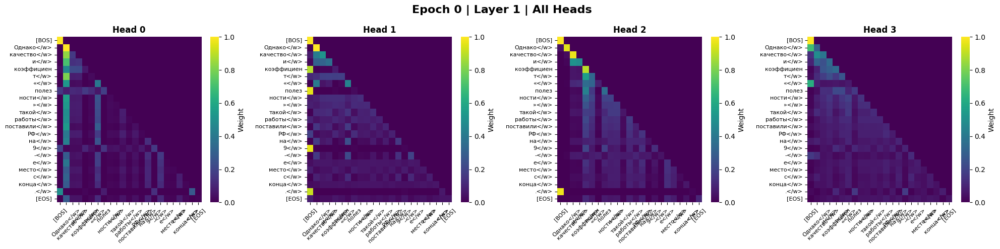

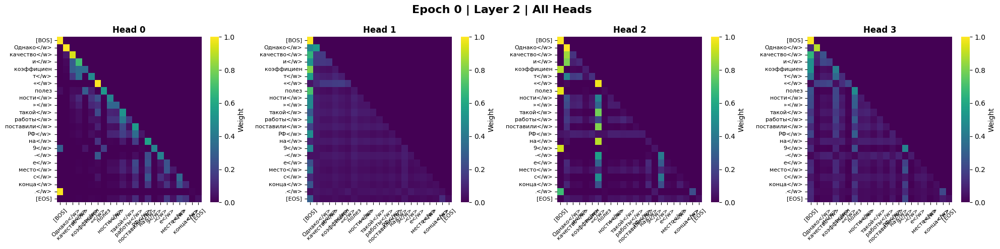

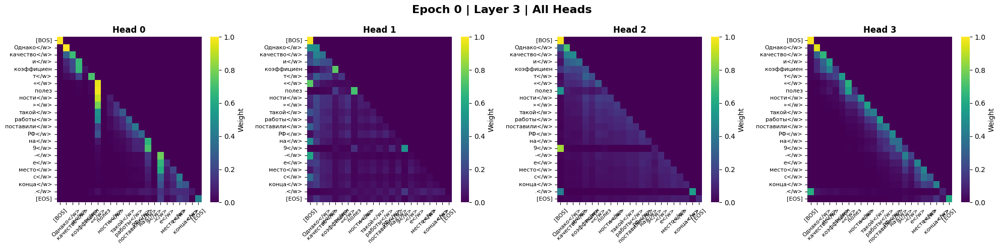


 Эпоха 1


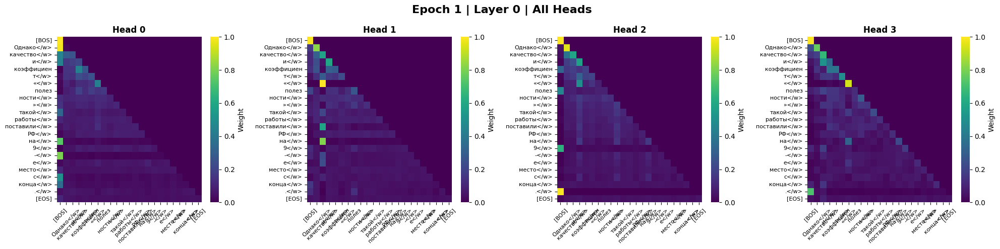

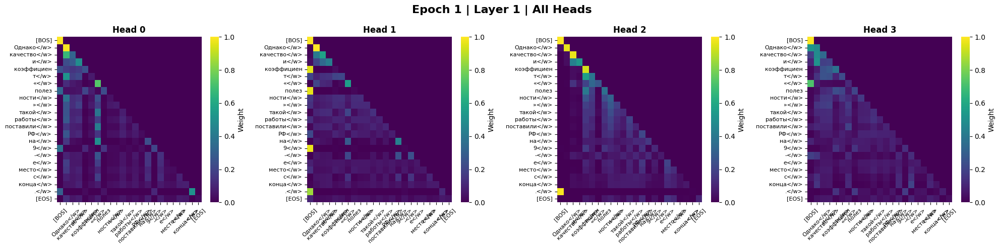

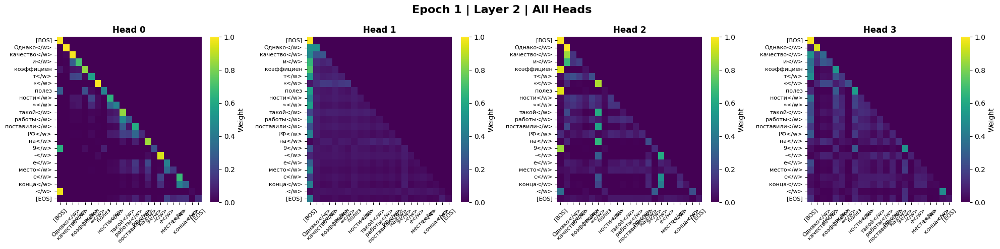

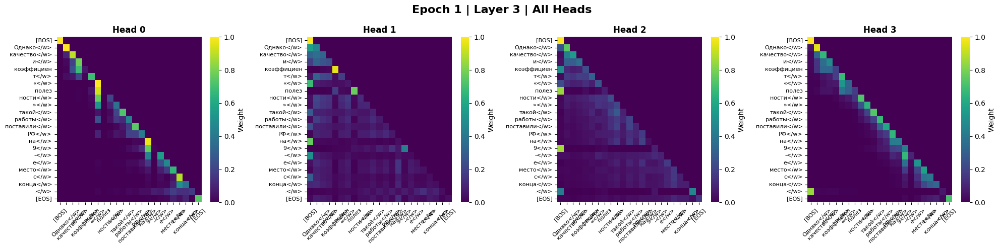


 Эпоха 2


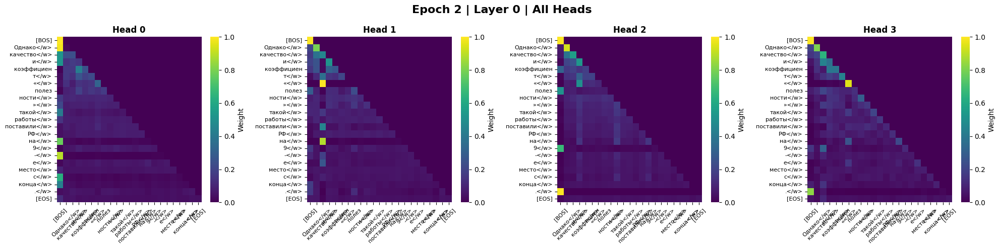

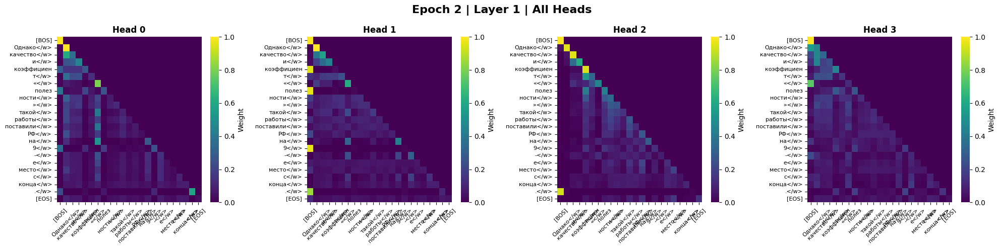

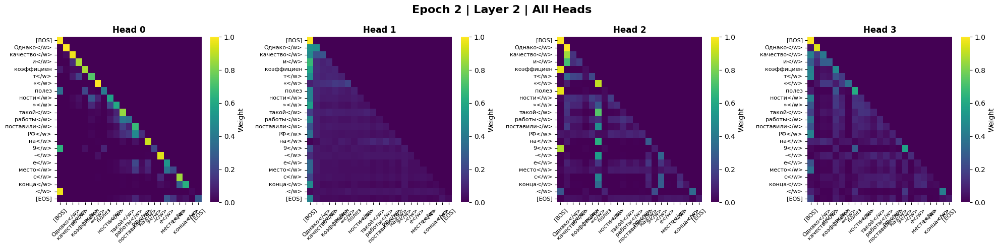

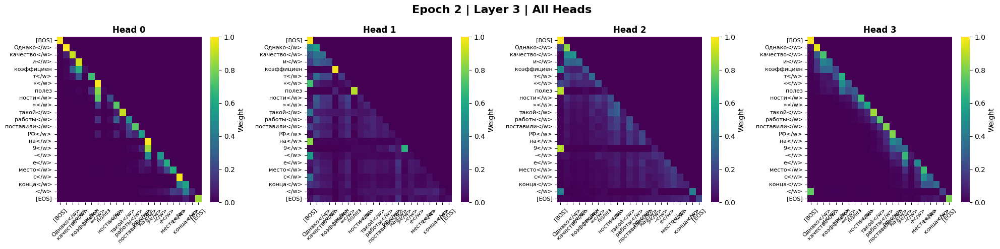


 Эпоха 3


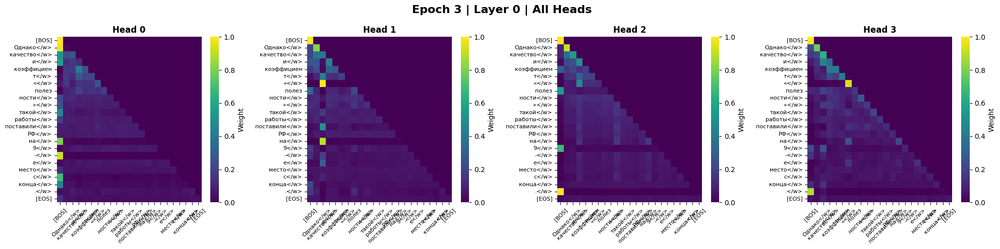

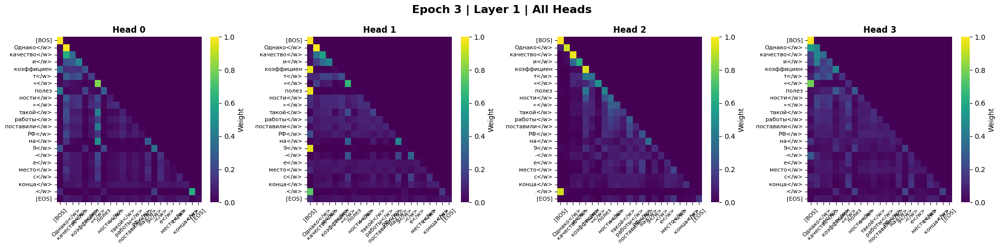

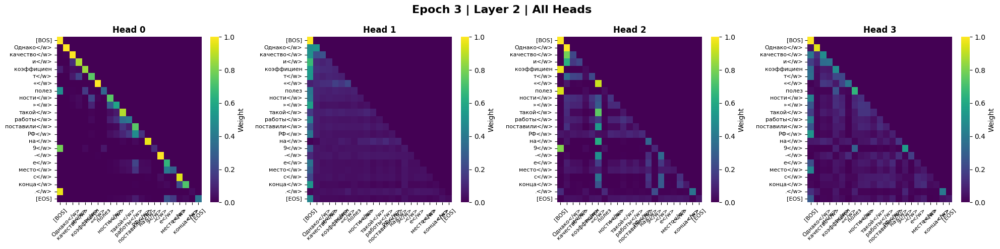

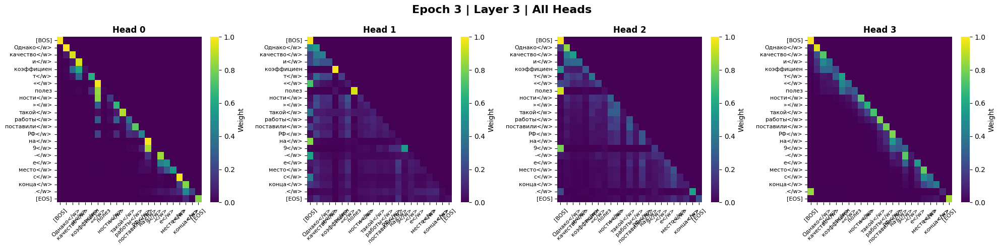


 Эпоха 4


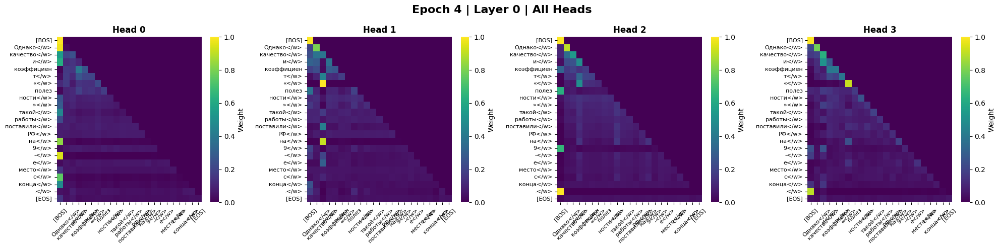

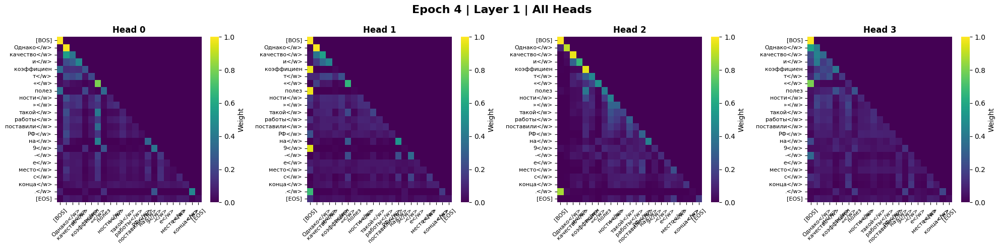

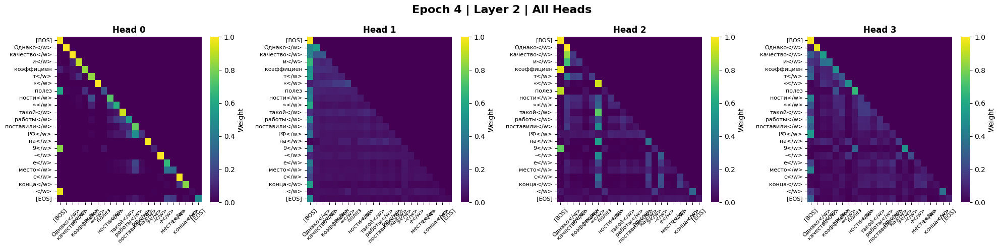

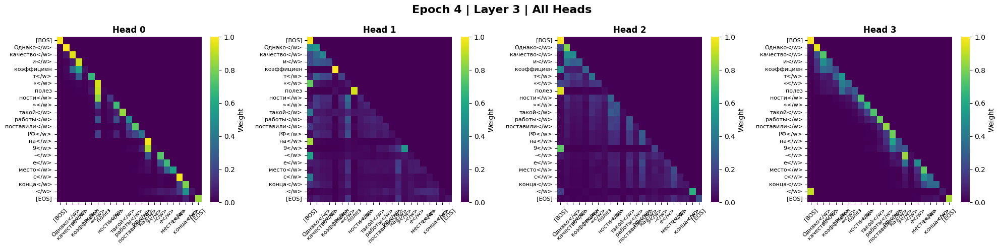


 Эпоха 5


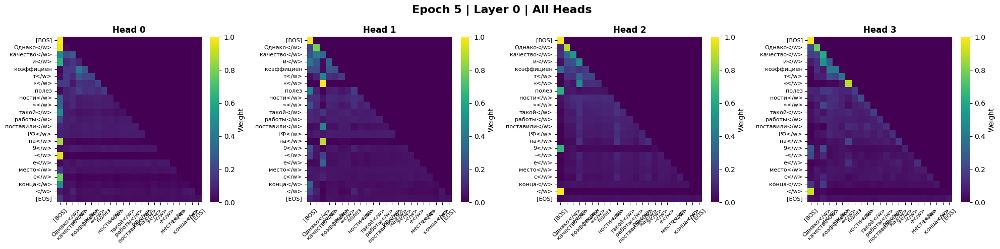

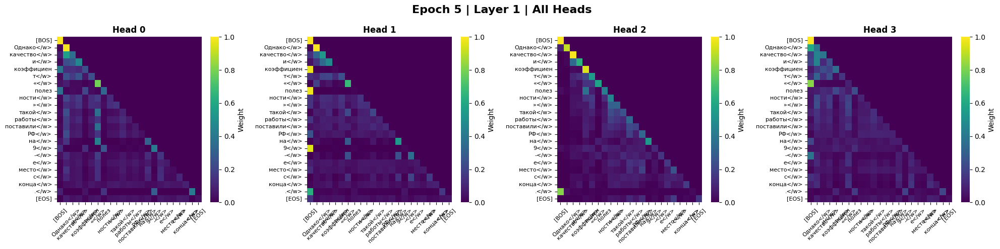

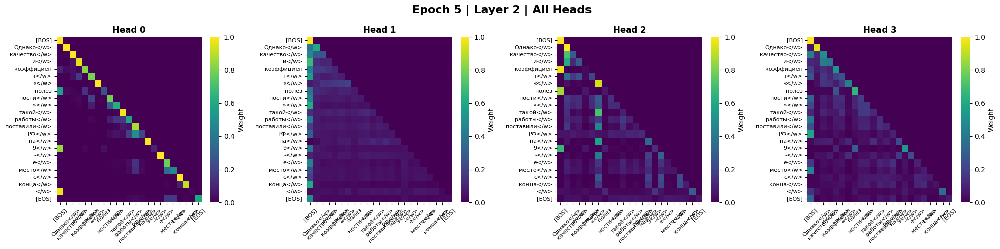

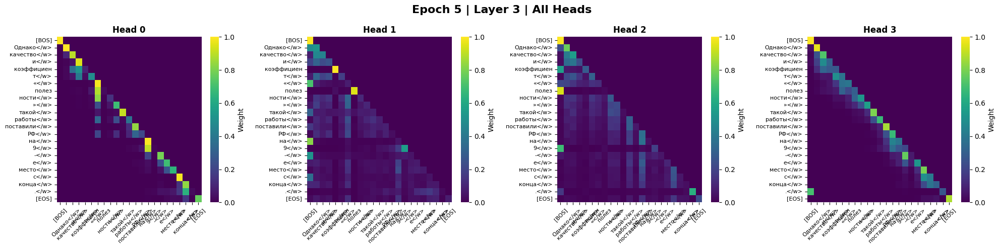


 Эпоха 6


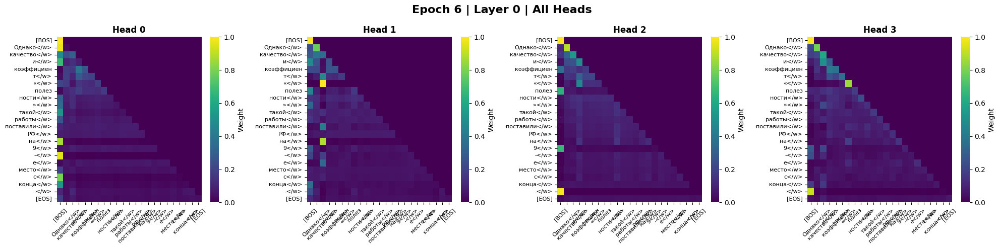

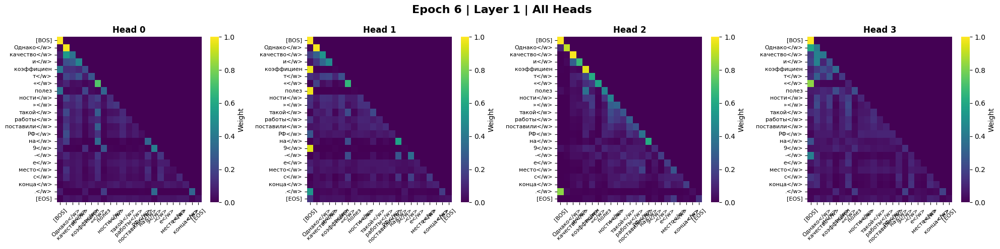

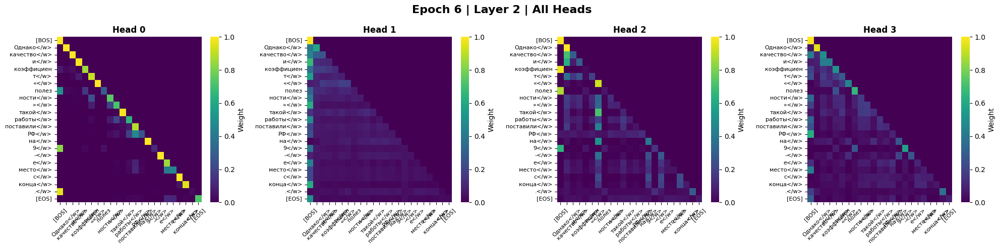

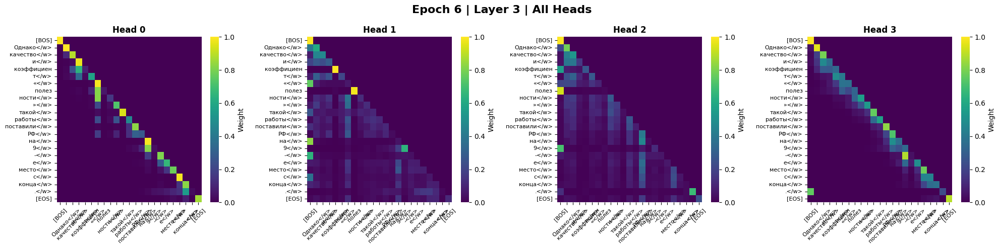


 Эпоха 7


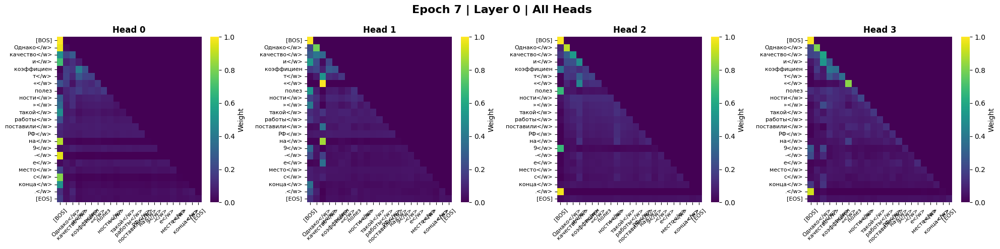

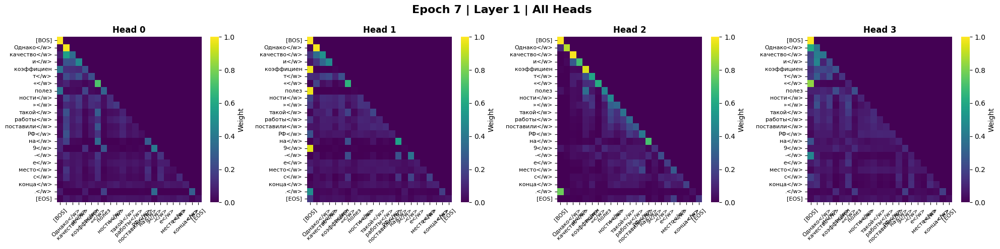

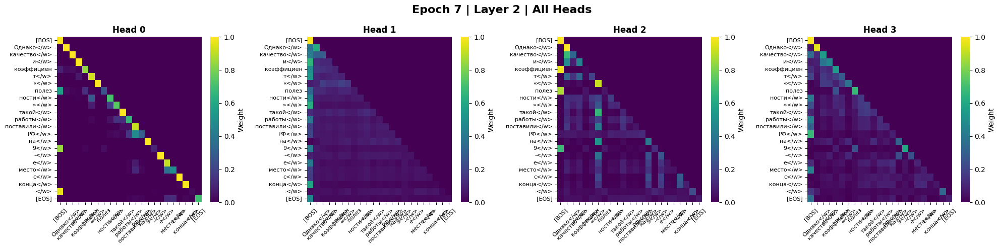

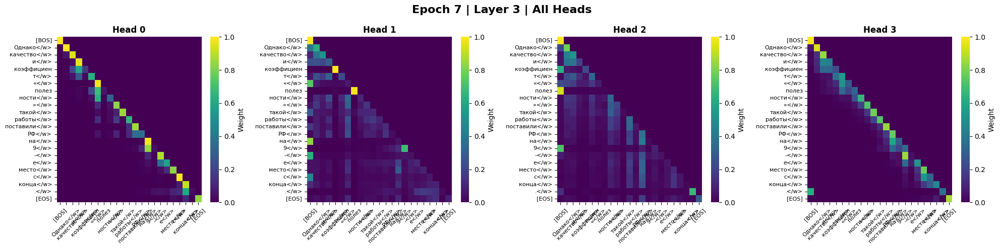


 Эпоха 8


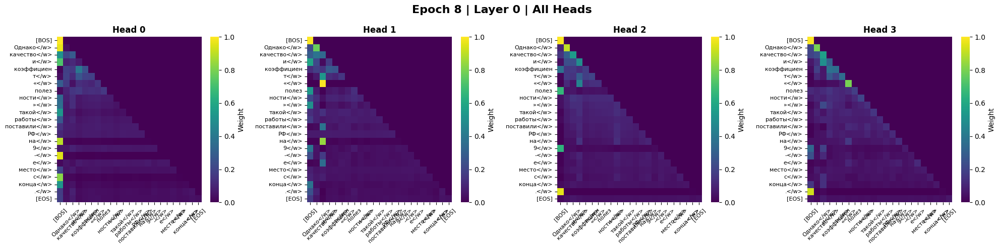

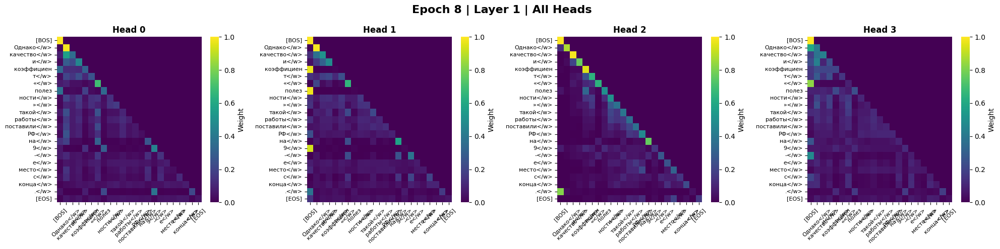

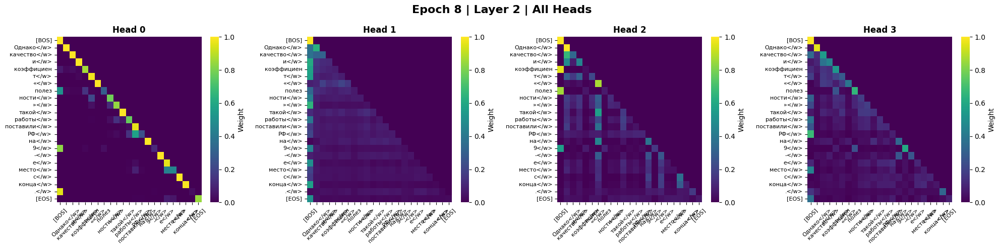

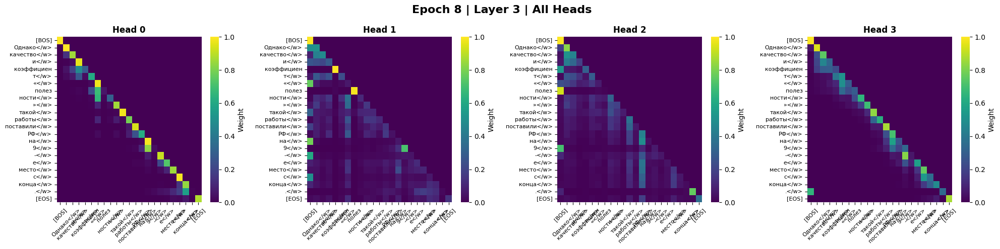


 Эпоха 9


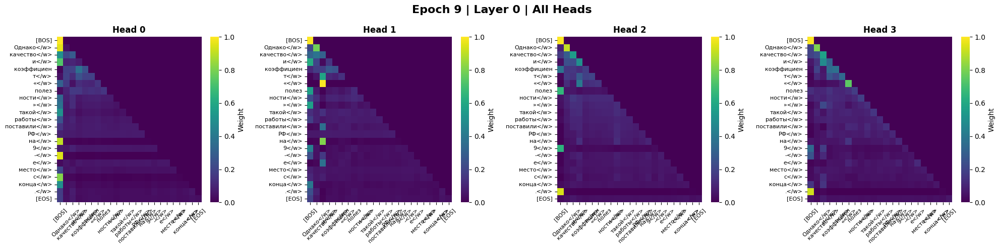

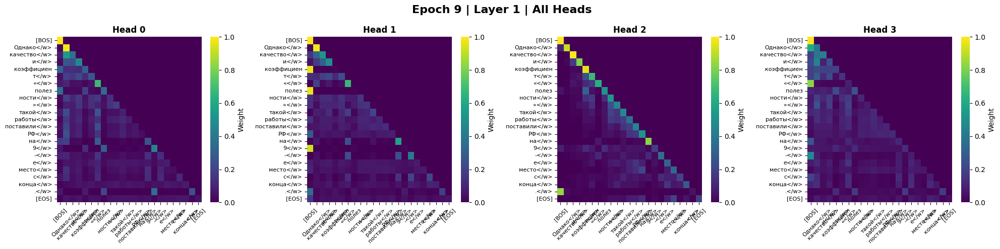

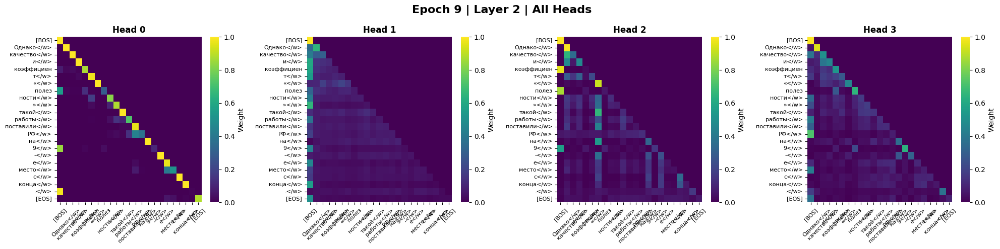

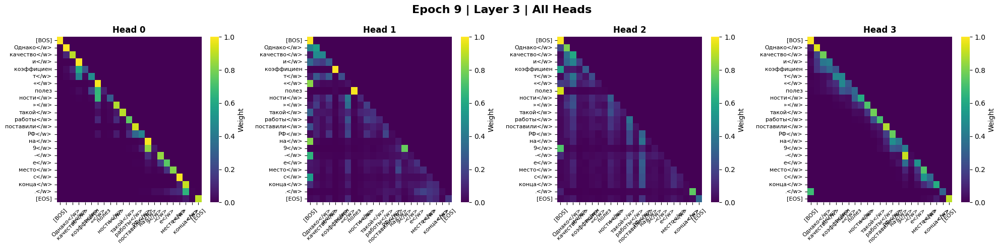


 Эпоха 10


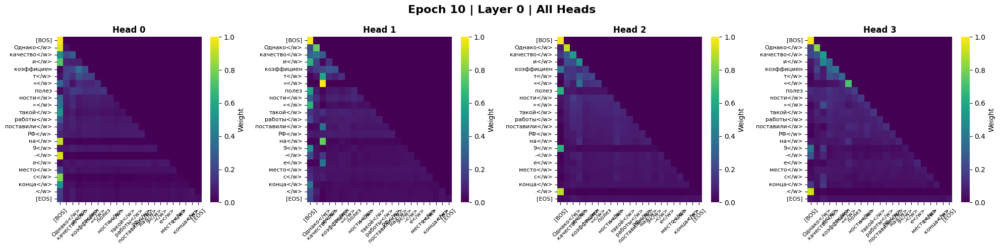

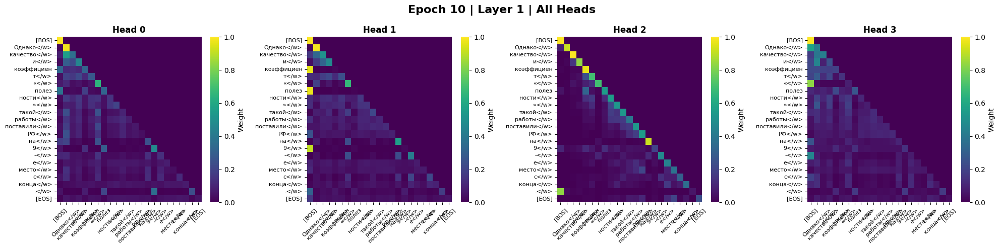

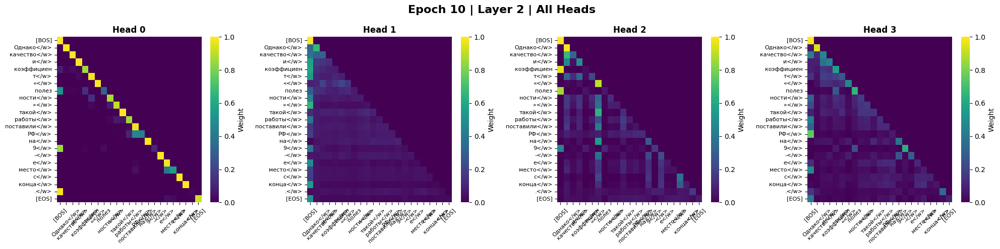

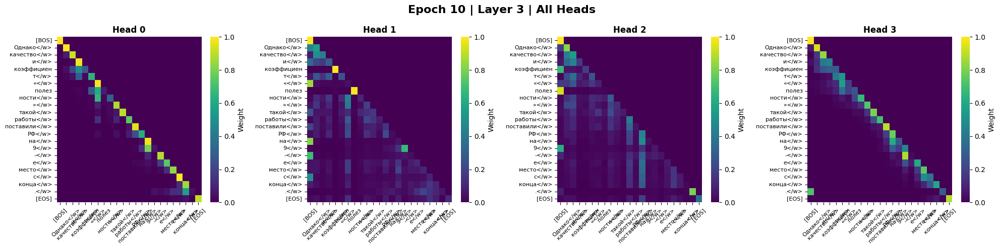


 Эпоха 11


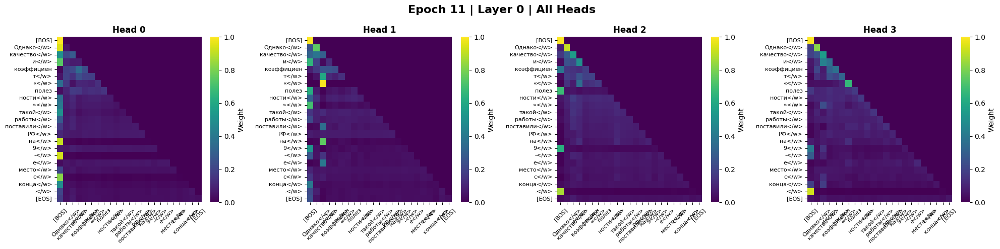

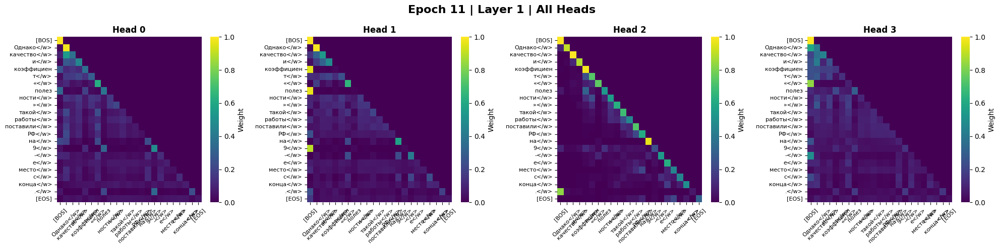

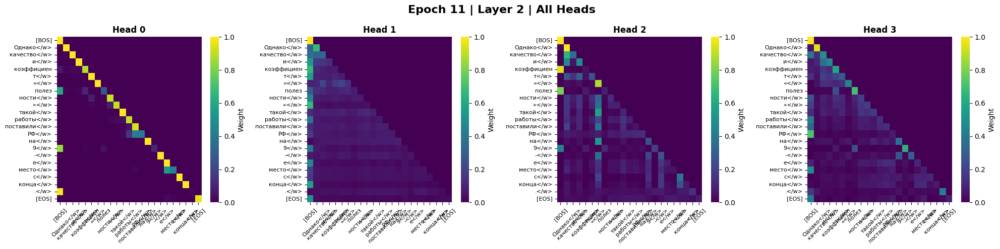

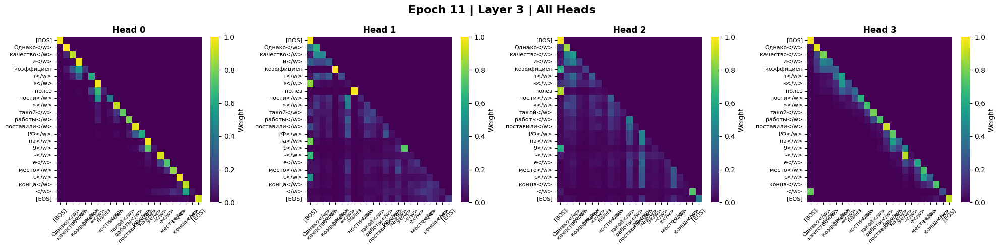


 Эпоха 12


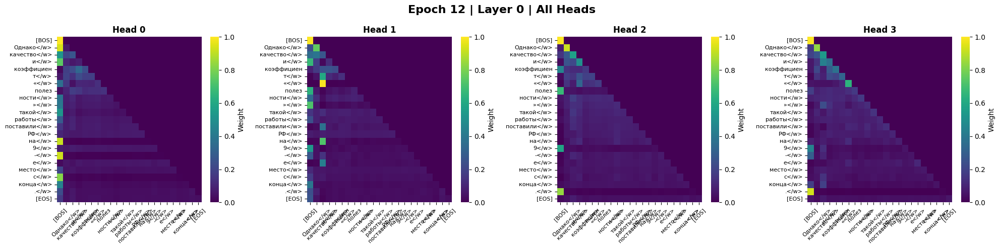

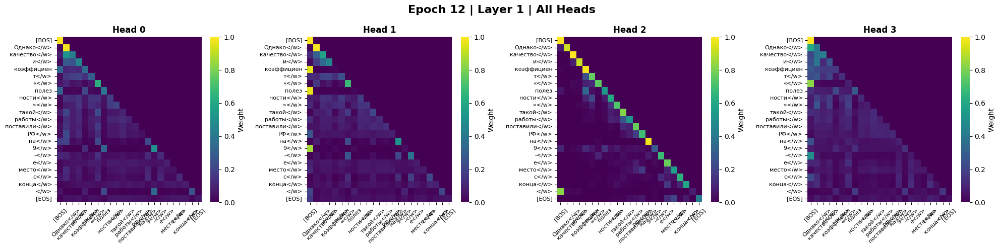

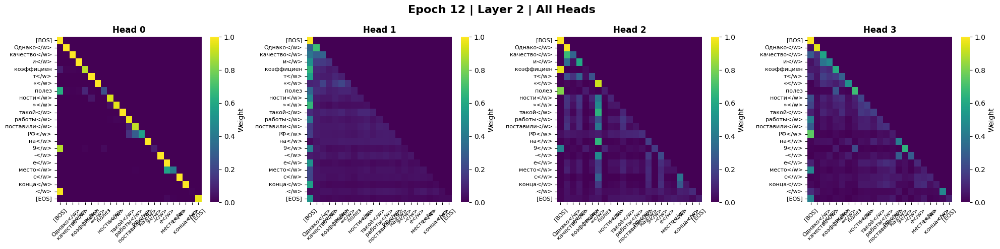

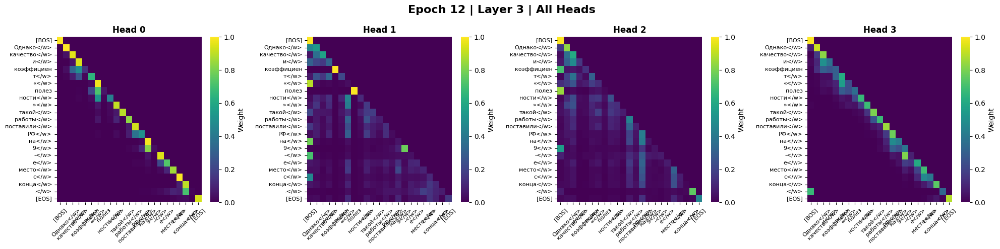


 Эпоха 13


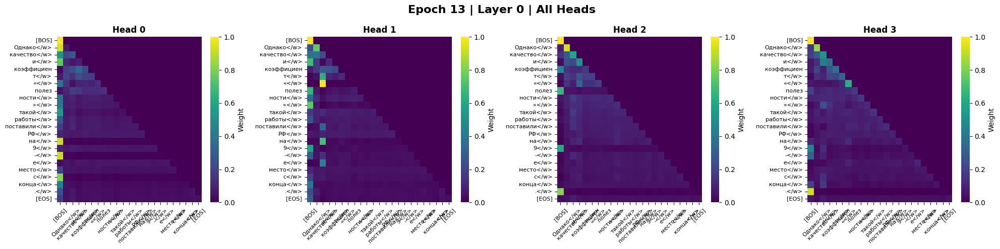

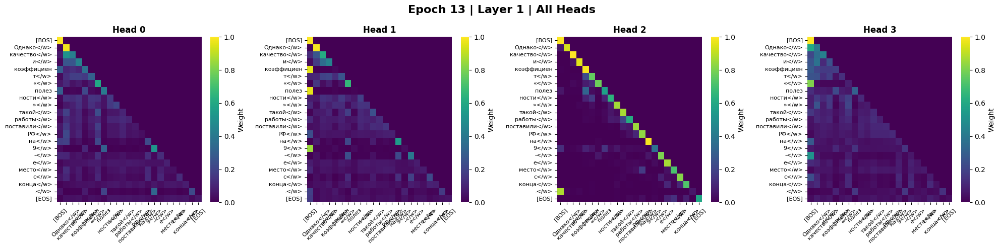

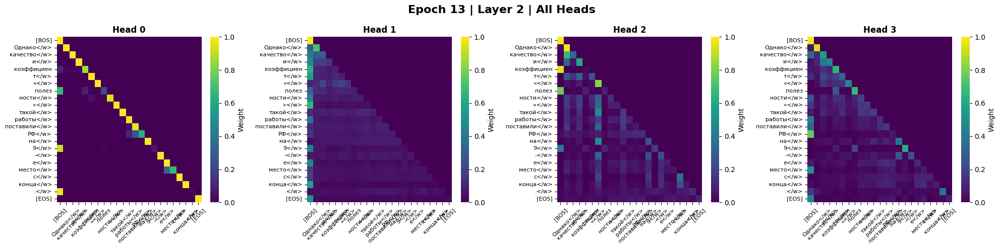

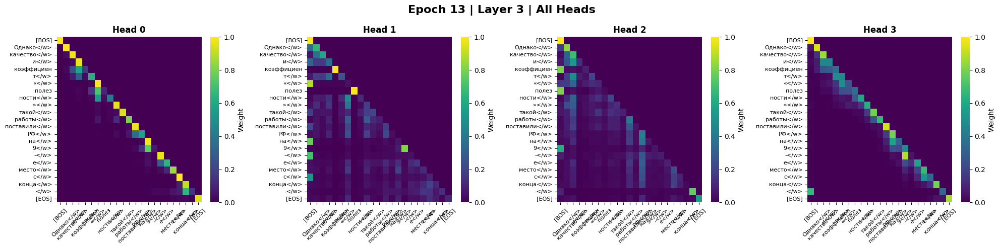


 Эпоха 14


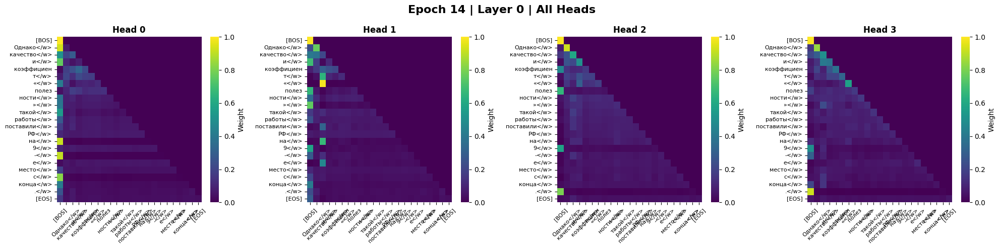

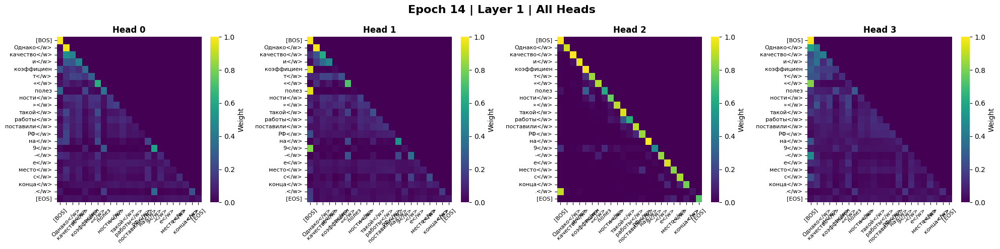

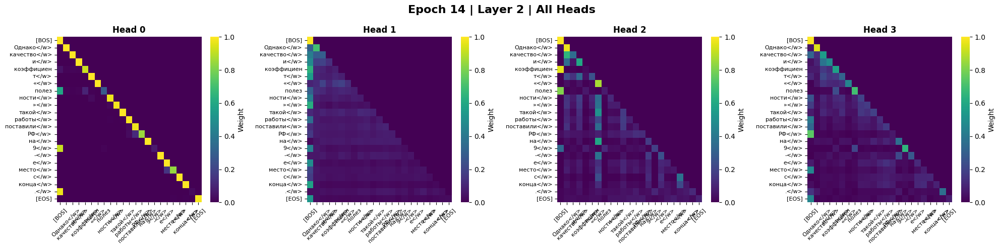

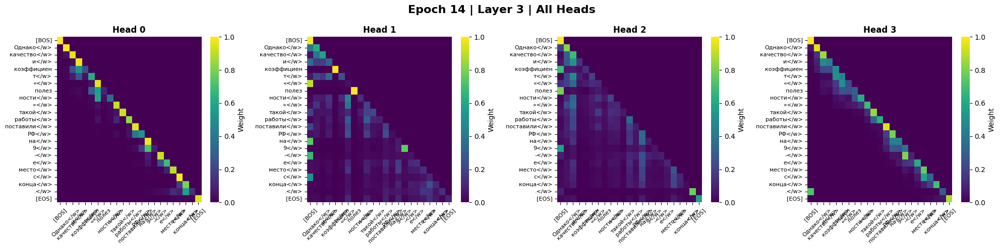


 Эпоха 15


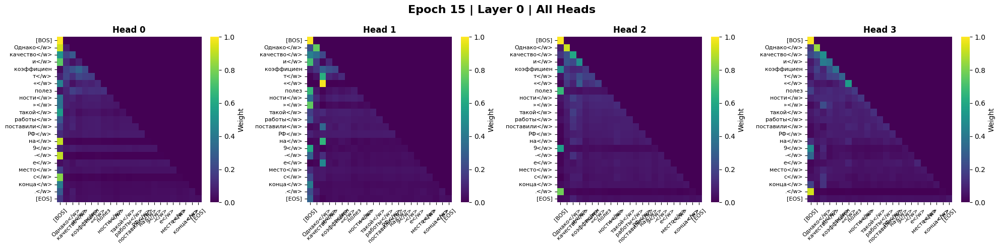

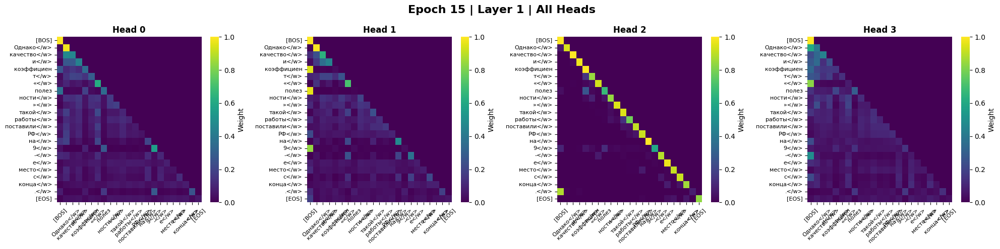

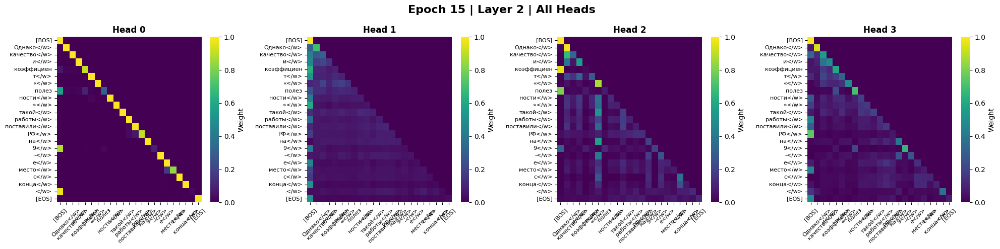

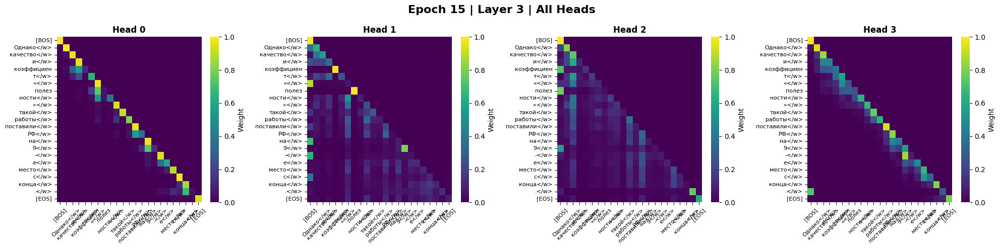


 Эпоха 16


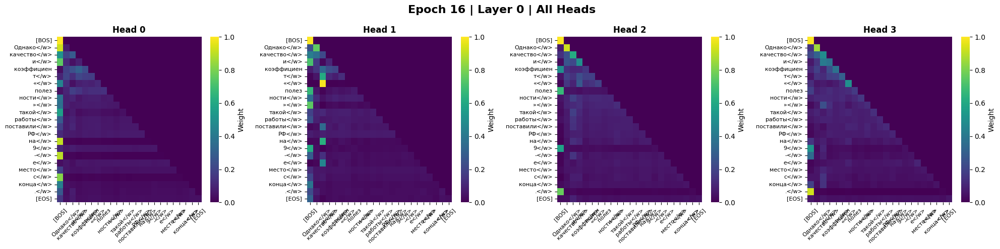

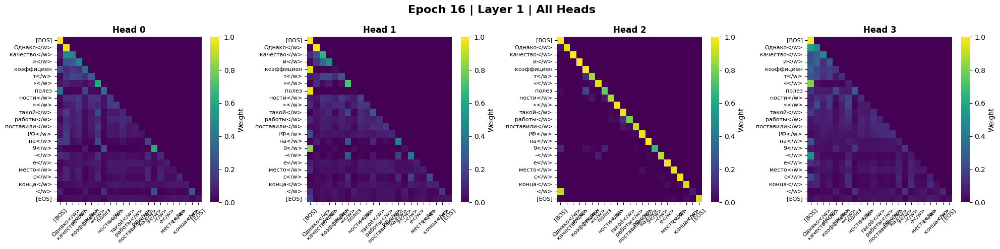

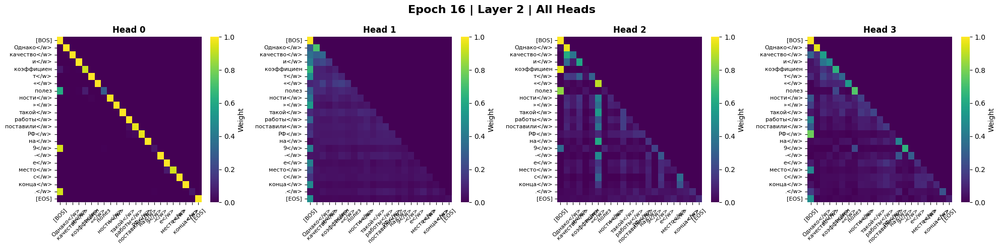

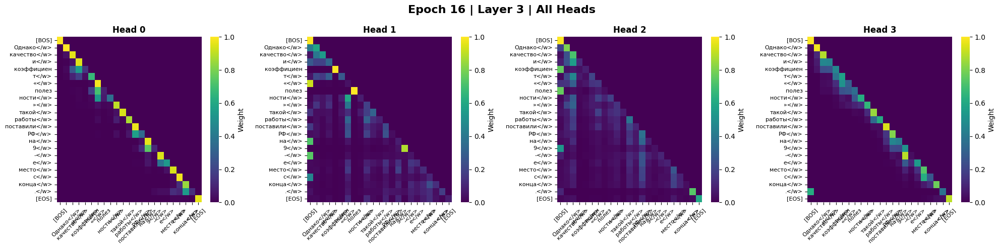


 Эпоха 17


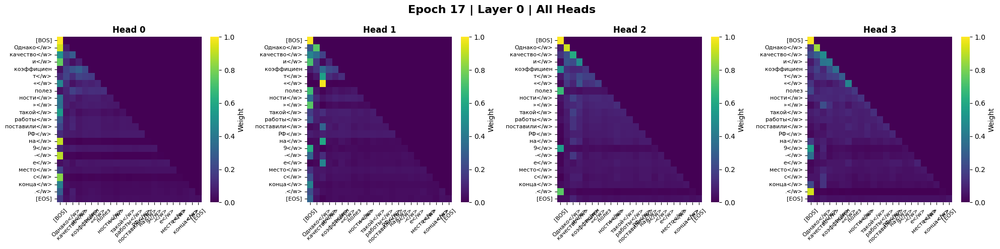

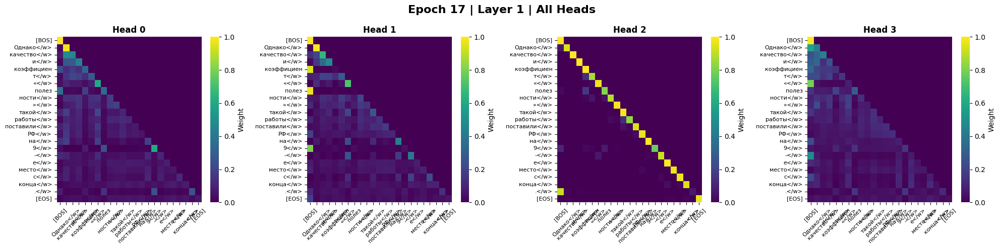

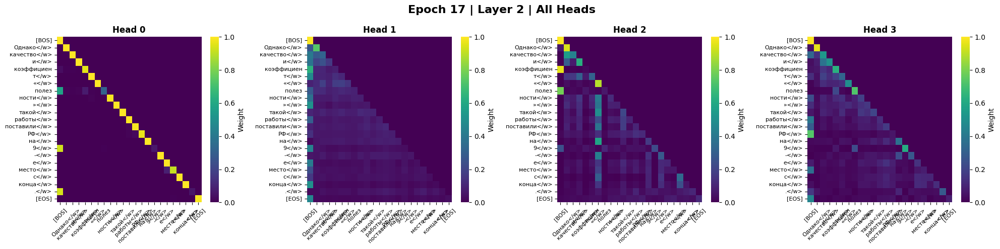

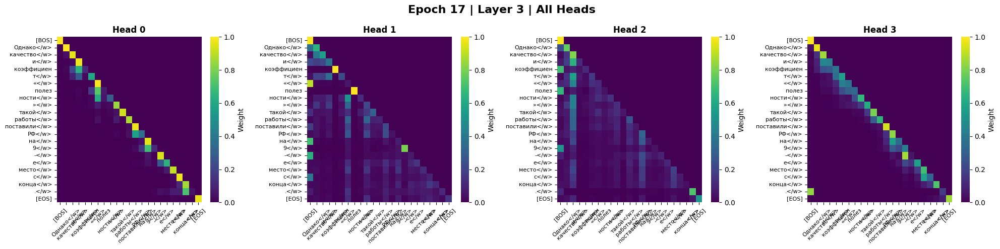


 Эпоха 18


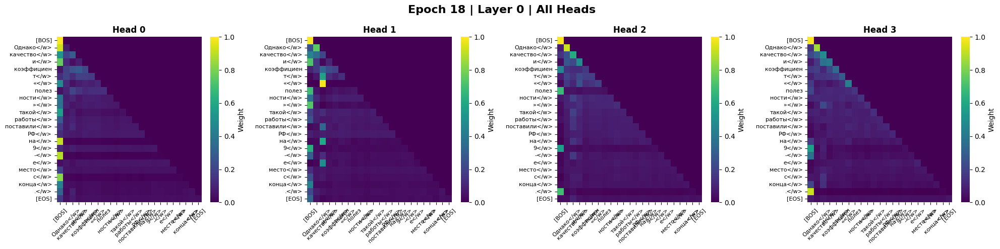

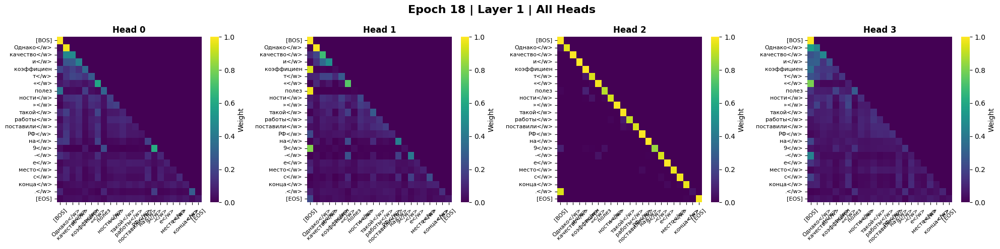

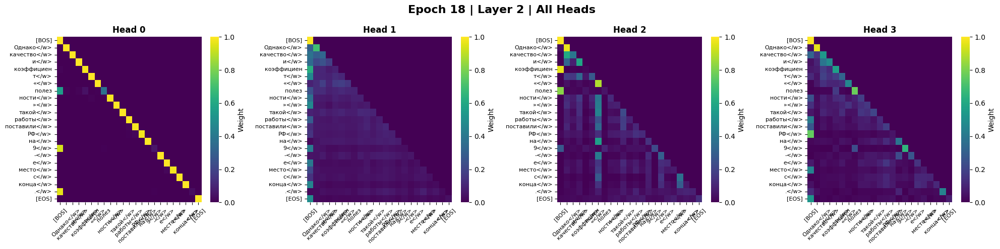

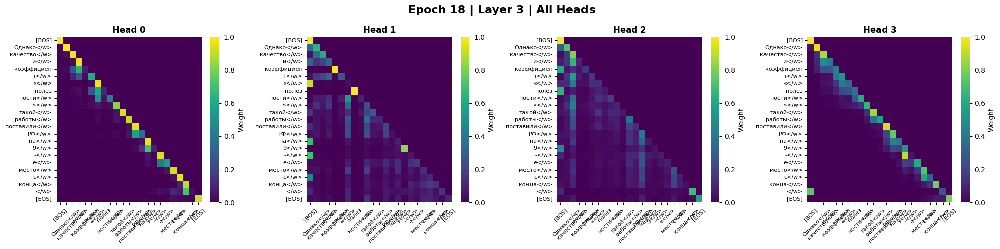


 Эпоха 19


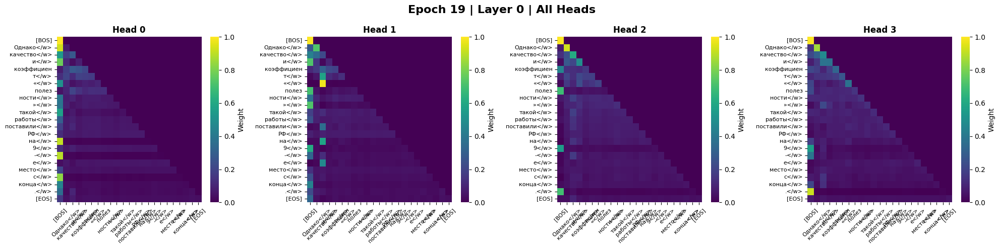

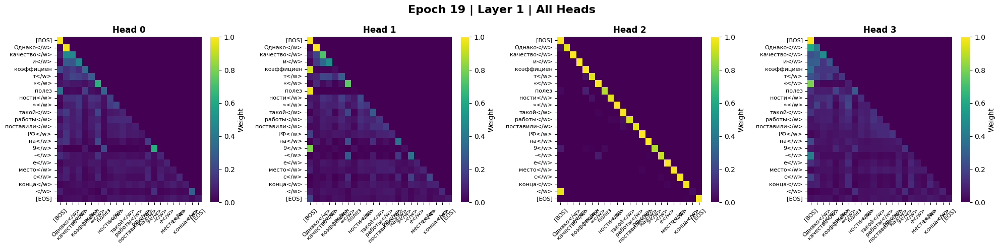

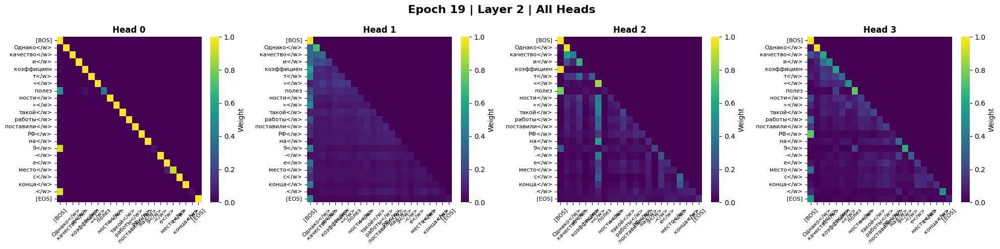

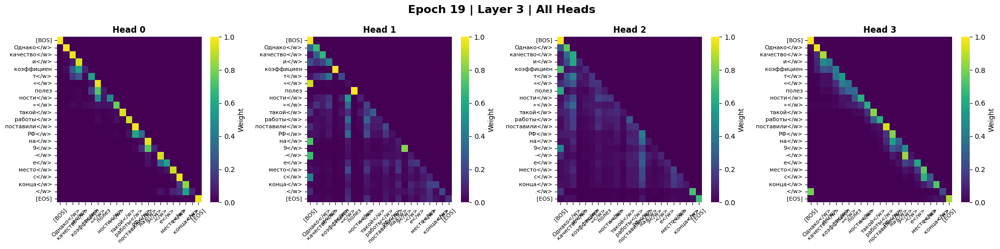

In [ ]:

print("Визуализация attention для каждой эпохи")

for epoch_idx in range(len(attention_by_epoch)):
    epoch_data = attention_by_epoch[epoch_idx]
    tokens = epoch_data['input_tokens']

    print(f"\n Эпоха {epoch_data['epoch']}")

    for layer_idx in range(n_layer):
        plot_all_heads_for_layer(
            epoch_data,
            tokens,
            layer_idx,
            epoch_data['epoch'],
            save_path=f'attention_layer_{layer_idx}_epoch_{epoch_data["epoch"]}.png'
        )

Визуализация attention для каждой головы

 Слой 0, Голова 0


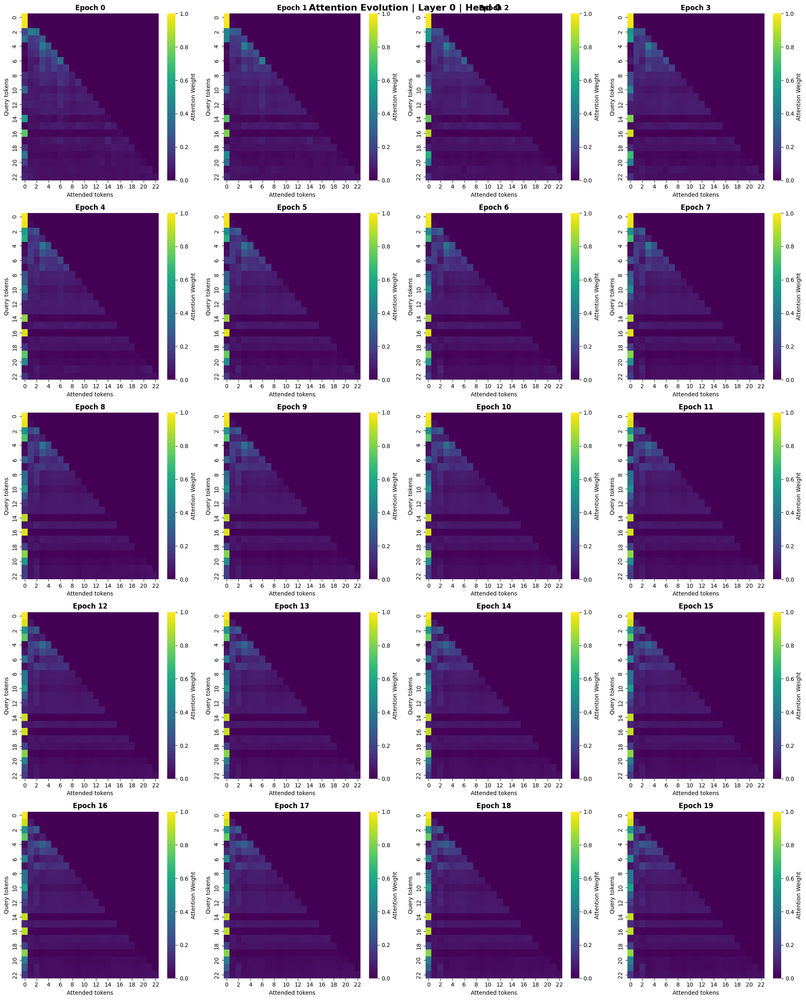


 Слой 0, Голова 1


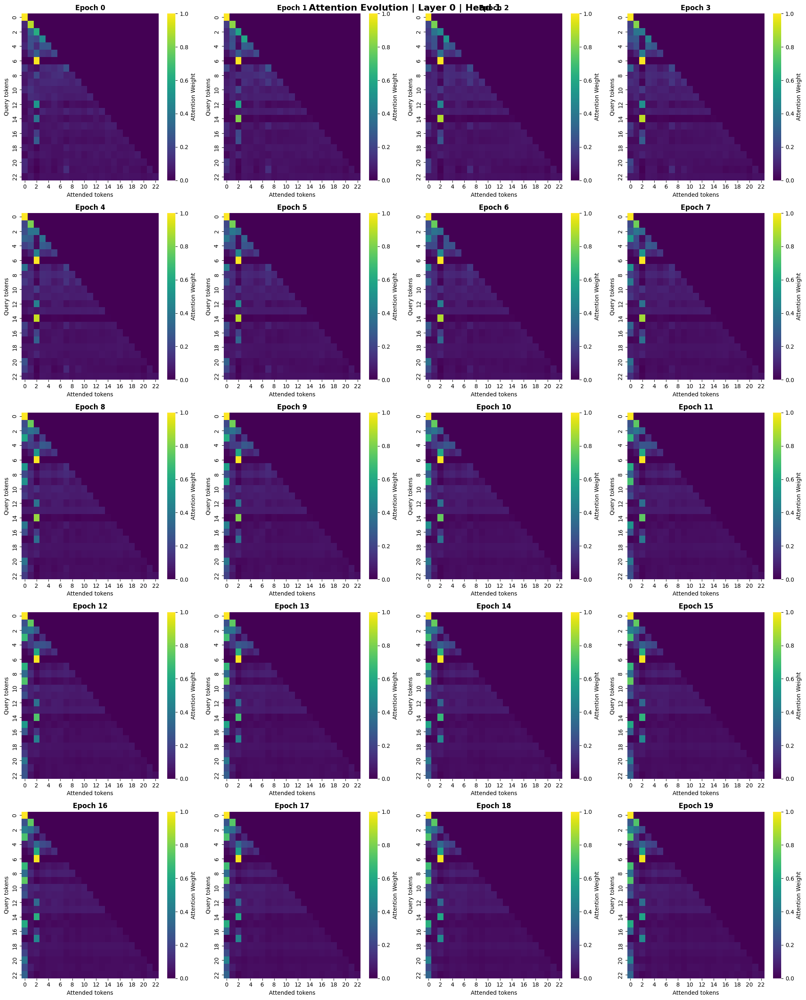


 Слой 0, Голова 2


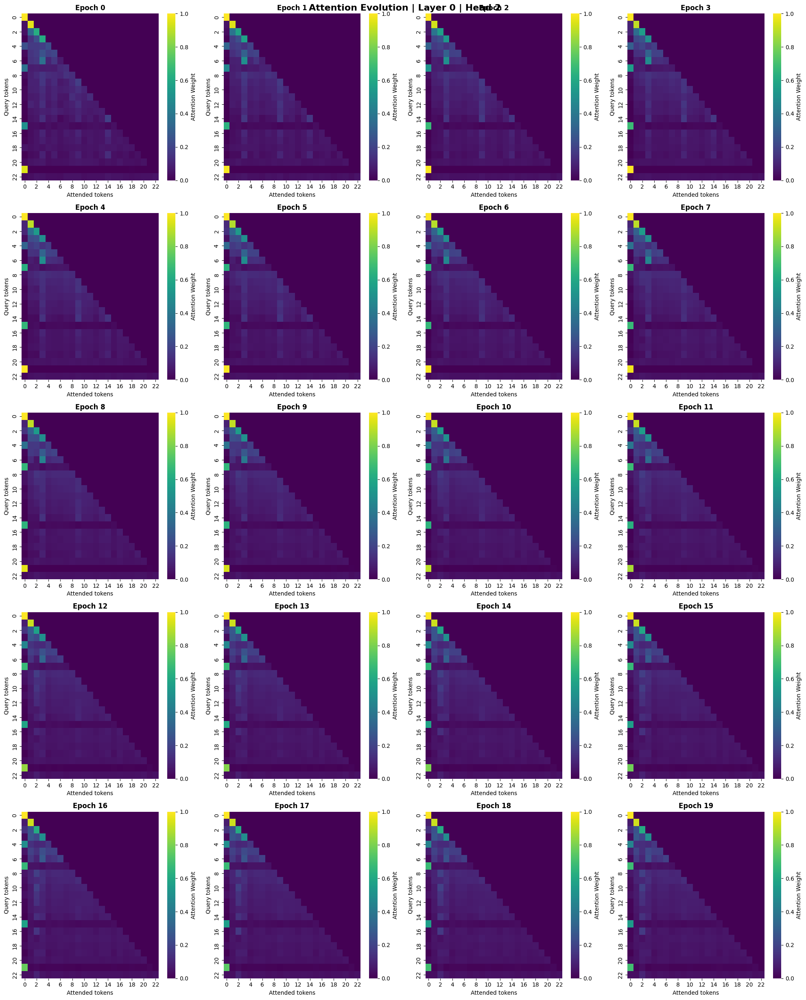


 Слой 0, Голова 3


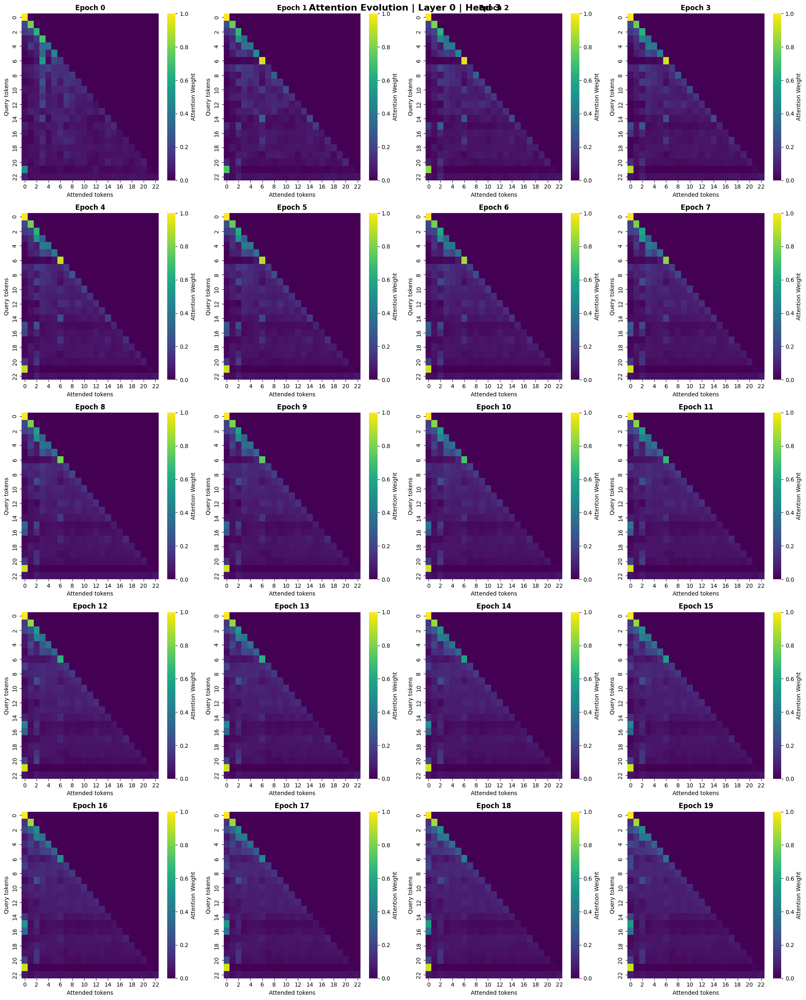


 Слой 1, Голова 0


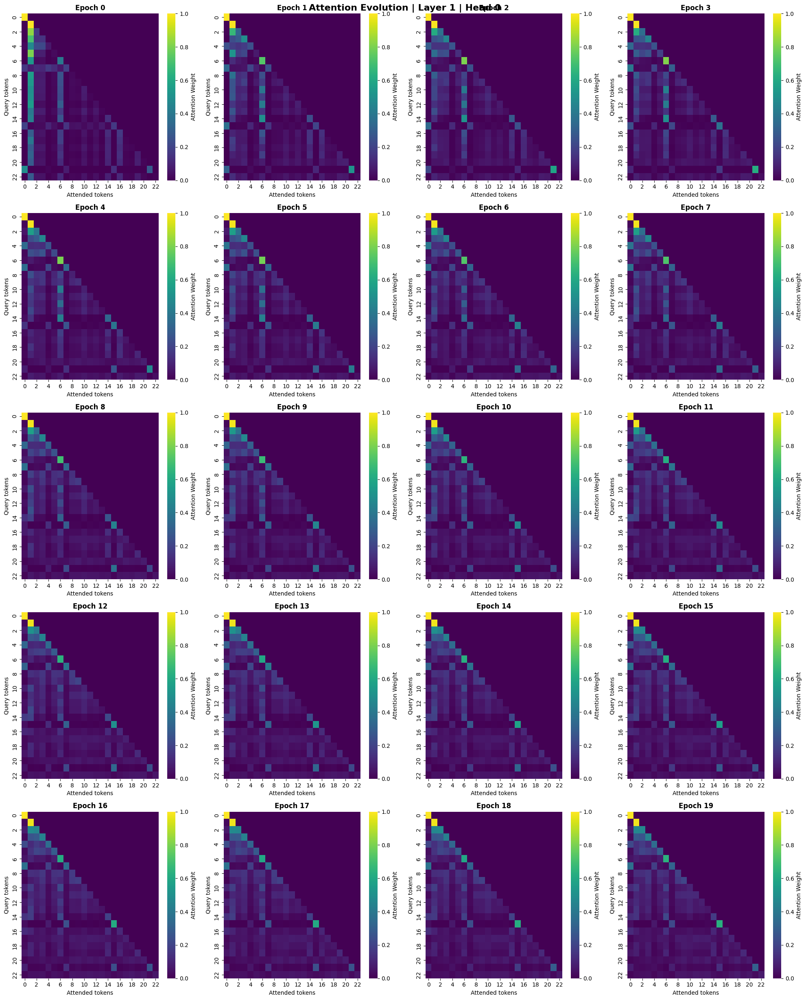


 Слой 1, Голова 1


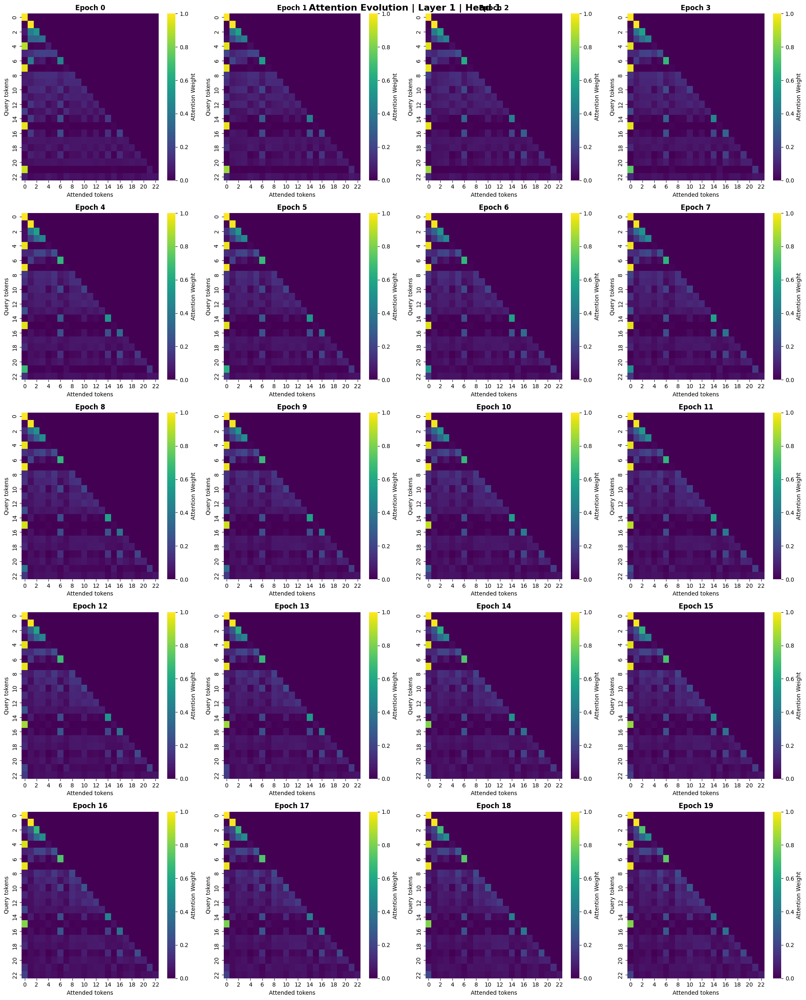


 Слой 1, Голова 2


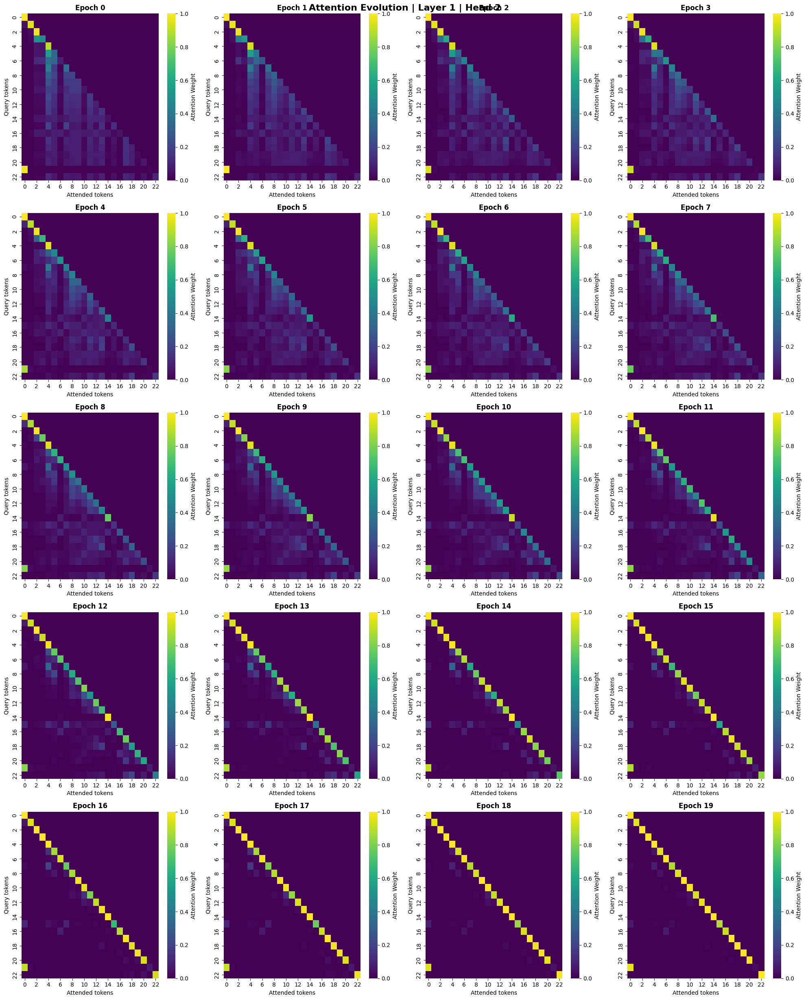


 Слой 1, Голова 3


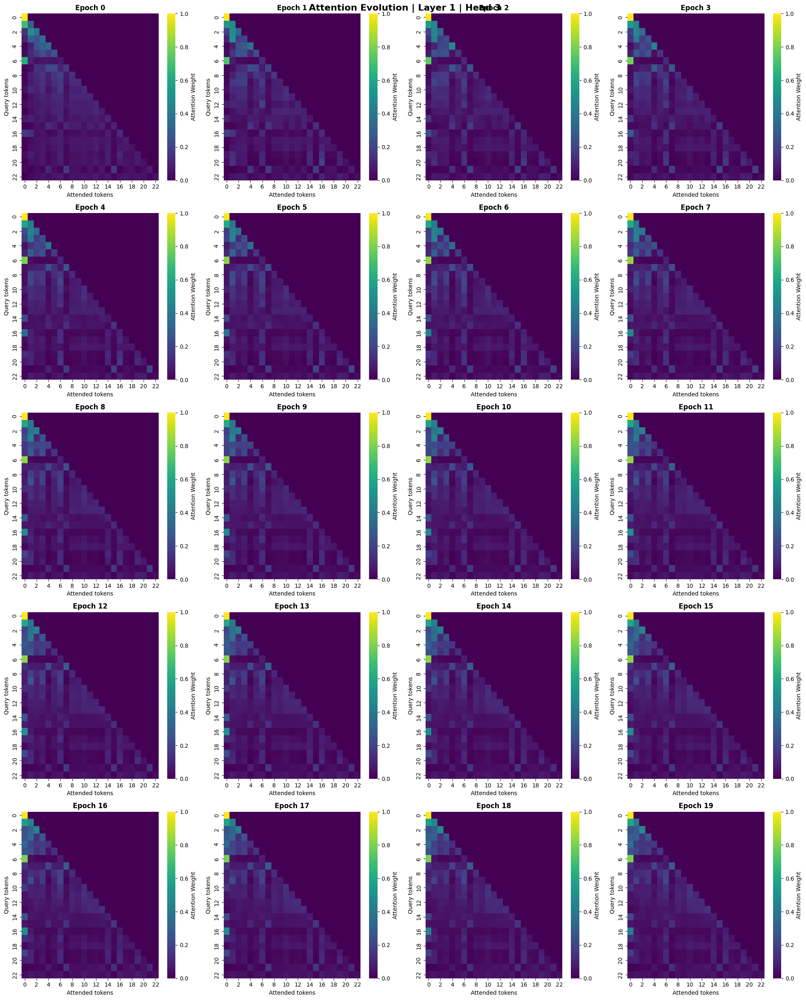


 Слой 2, Голова 0


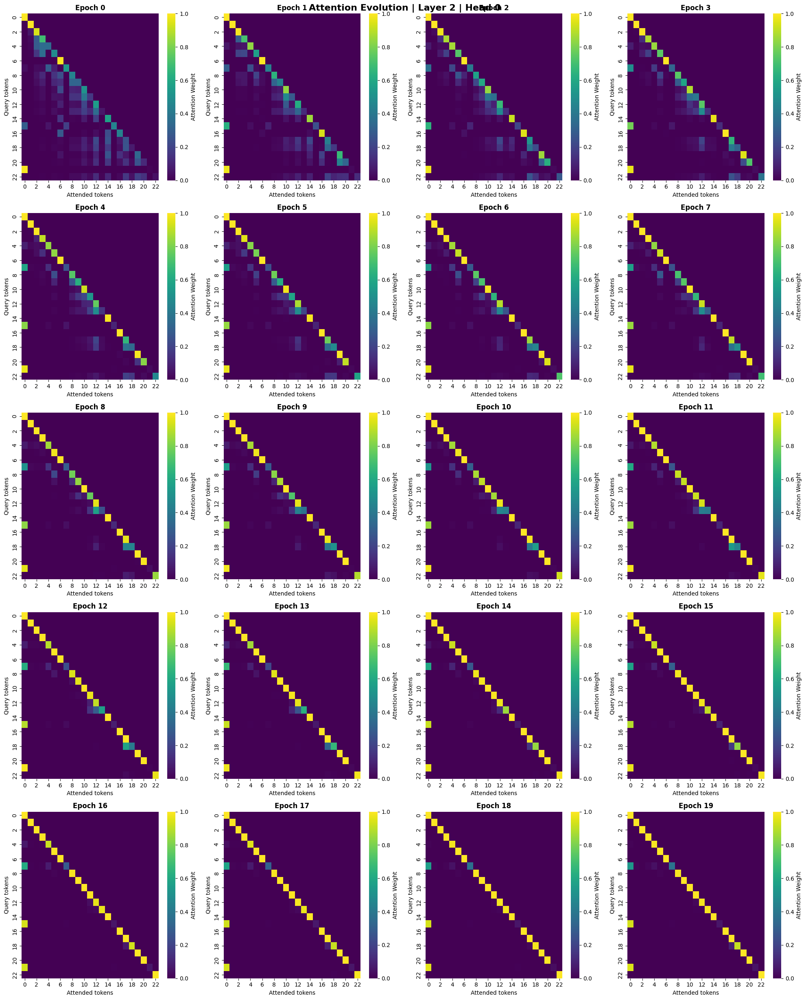


 Слой 2, Голова 1


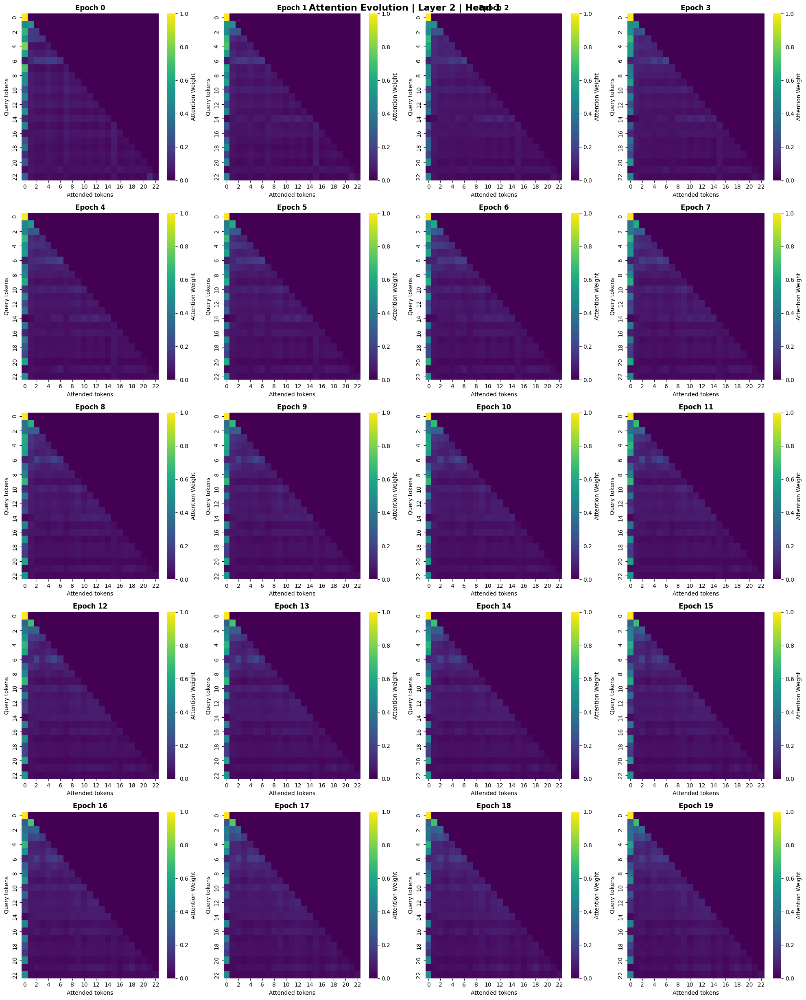


 Слой 2, Голова 2


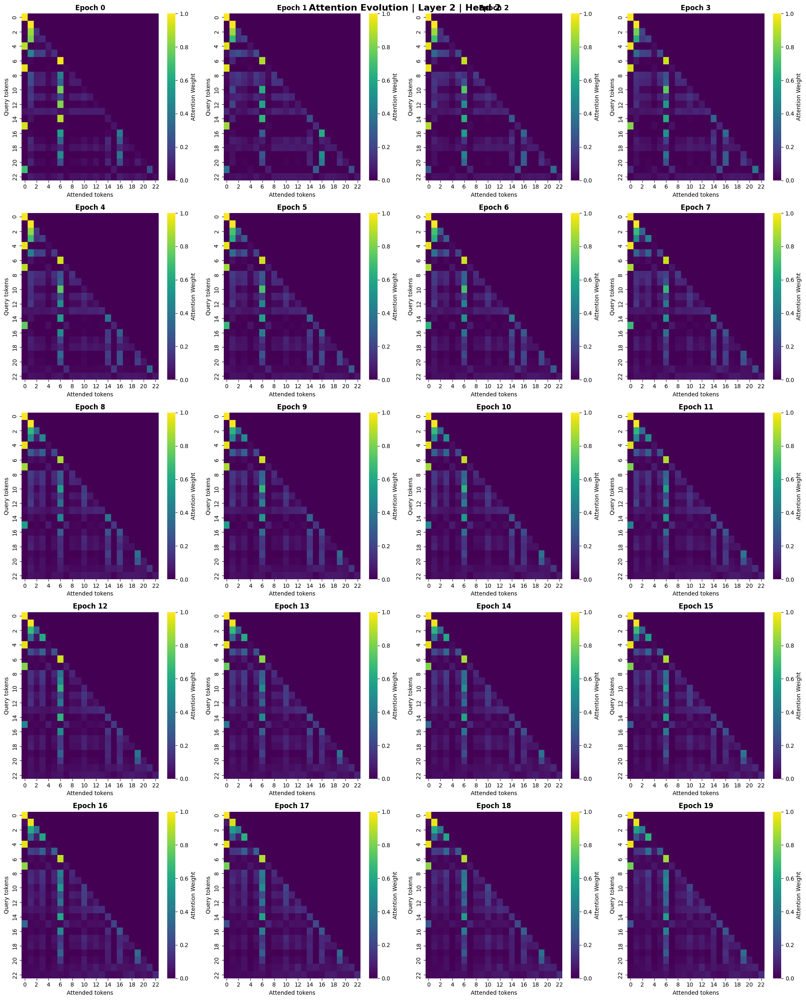


 Слой 2, Голова 3


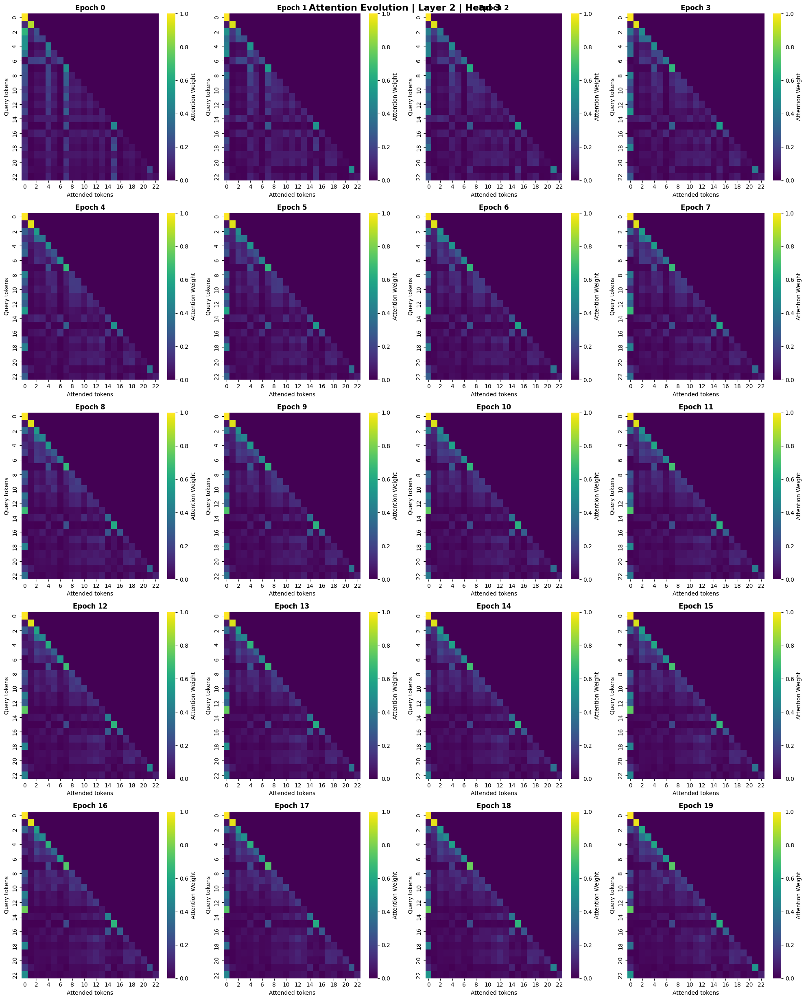


 Слой 3, Голова 0


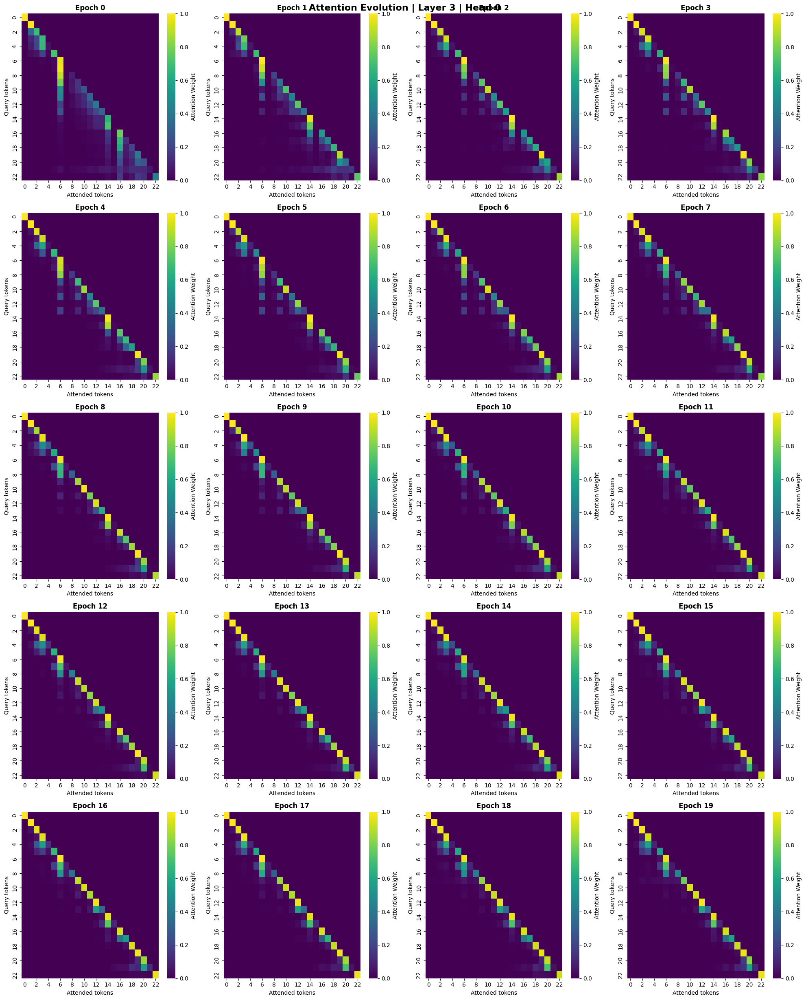


 Слой 3, Голова 1


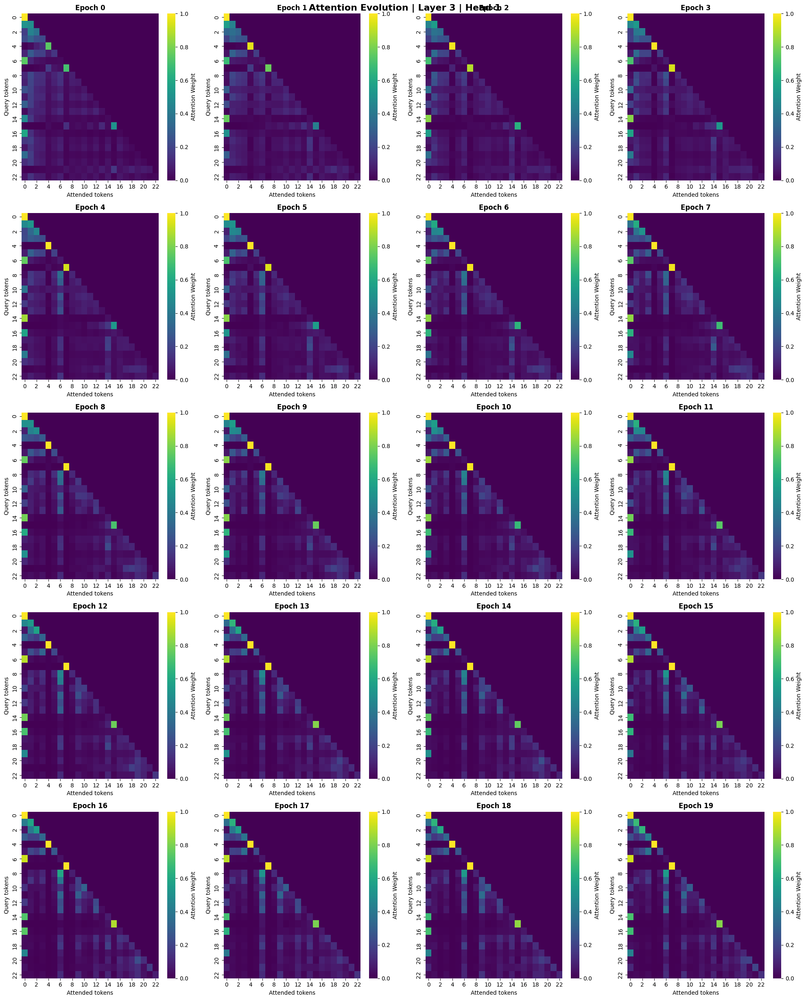


 Слой 3, Голова 2


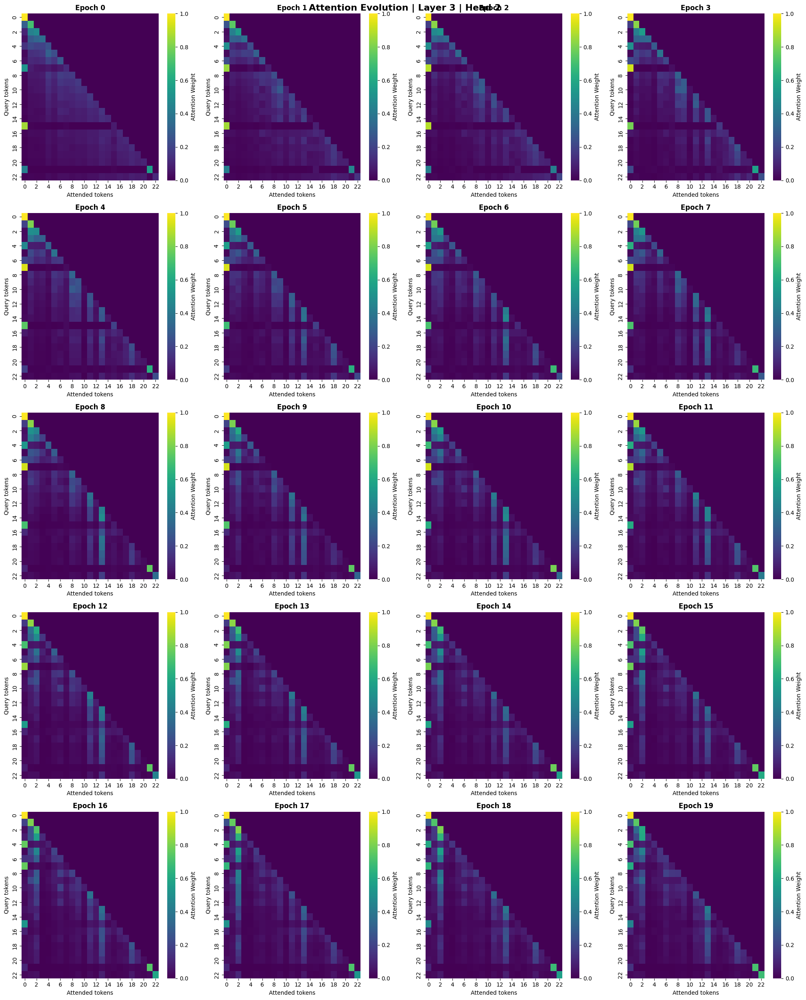


 Слой 3, Голова 3


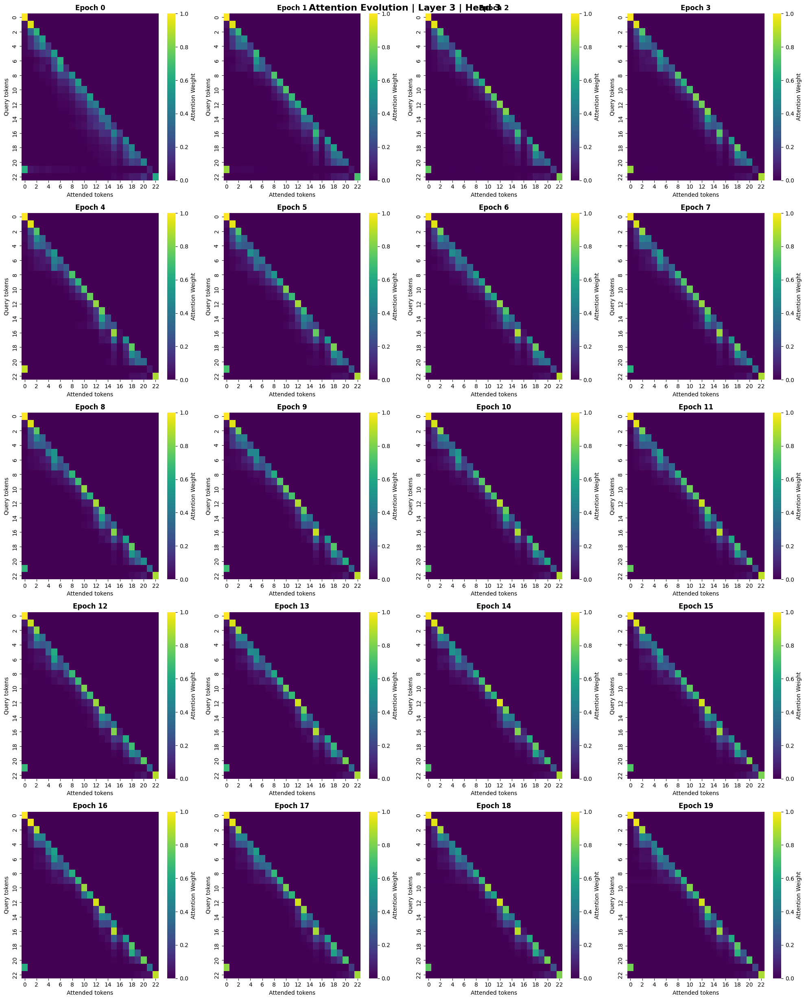

In [ ]:
print("Визуализация attention для каждой головы")

for layer_idx in range(n_layer):
    for head_idx in range(n_head):
        print(f"\n Слой {layer_idx}, Голова {head_idx}")

        plot_attention_evolution(
            attention_by_epoch,
            layer_idx=layer_idx,
            head_idx=head_idx,
            token_positions=[],
            save_path=f'attention_evolution_layer{layer_idx}_head{head_idx}.png'
        )

**Результаты:**

Корректно для GPT архетектуры отображаются нижнеугольные матрицы.

Во всех полученных результатах в матрицах внимания не проиходило неожиданных перемен или скачков, кждая голова в каждом слое уменьшала или увеличевала внимание в первоночальном паттерне 0 эпохи.

**Анализ 0 слоя**

Head 0 - Показывает относительно равномерное распределение внимания с переодическим фокусом на "BOS".

Head 1 - Видны яркие  пятна, указывающие на сфокусированное внимание на  токен "качество" получают повышенное внимание.

Head 2 - Распределенное внимание с плавными градиентами. Голова, похоже, учитывает более широкий контекст.

Head 3 - Похожа на Head 0, но с немного другими акцентами. Видно внимание к структурным элементам текста. Также только эта голова значительно менялась в ходе обучения.

***Вывод по слою 0***

Базовый слой занимается сбором общей информации и выделением структурных маркеров. Head 3 показал наибольшую адаптацию в ходе обучения.

**Анализ 1 слоя**

Head 0 - Снижает внимание на протяжении обучения приходя к более общим паттернам.

Head 2 - На протяжении обучения от внимания на несколько предыдущих слов приходит практически только к главной диагонали, только "." имеет вес на "BOS", а не на самой себе.

Head 0,1,3 - демонстрируют распределенное внимание с некоторыми яркими пятнами на самом себе или "BOS".

***Вывод по слою 1***

Слой специализируется на само-внимании и маркировании границ предложений. Head 2 явно выделяет конец предложения ("."), что указывает на понимание границ предложений.

**Анализ 2 слоя**

Head 0 - На протяжении обучения от внимания на несколько предыдущих слов приходит практически только к главной диагонали.

Head 1 - во время обучения перходит от равномерности к концентрации на "BOS".

Head 2 - Показывает более сложные паттерны внимания с вертикальными и горизонтальными линиями - возможно, эта голова учится отслеживать определенные синтаксические или семантические связи.

Head 3 - Демонстрирует свой уникальный паттерн распределения весов внимания.

***Вывод по слою 2***

Слой, возмодно, начинает выделять ключевые существительные и синтаксические связи.

**Анализ 3 слоя**

Head 0 - высокая значимость " ' " на 0 эпохе, которая снижается. И итоговая матрица обращает внимание на себя и близжайшие токены.

Head 1 - имеет вертикальные полосы, заметные на токенах: кавычек, "поставили", "на", "с", "конца"

Head 2 - во време обучения перходит от равномерности к неярким но вертикальным полосам, особенно заметны "РФ","качество".

Head 3 - Итоговая матрица обращает внимание на себя и близжайшие токены.

***Вывод по слою 3***

Последний слой специализируется на синтаксических маркерах (глаголы, предлоги, пунктуация) и ключевых сущностях.

***Вывод***

Матрицы внимания выявляют постепенное формирование синтаксически осмысленных связей: если на начальных слоях доминирует внимание к структурным маркерам (BOS, пунктуация), то в глубоких слоях появляются вертикальные и горизонтальные полосы, соответствующие зависимостям между знаменательными частями речи. Отсутствие резких скачков между эпохами говорит о плавной оптимизации, а не о переключении стратегий.